In [1]:
from functools import partial
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as v2
from torch.utils.data import random_split, DataLoader
from ray import tune, train
import tempfile
import torchDatasets as ds
from ray.train import Checkpoint
from ray.tune.schedulers import ASHAScheduler
# from torchvision.models import resnet50, resnet18
import networks as custNN

device = "cpu"
if torch.cuda.is_available():
    device = "cuda"

modelName = "Autoencoder"; side = 30; nTargets = 2
base_dir = '/home/shashank/Code/gonihedric/'; dataDir = base_dir + "data/"
trainScheme = "Autoencoder"
# criterion = nn.MSELoss()
criterion = nn.BCELoss()

# class ReshapeTransform:
#     def __init__(self, shape):
#         self.shape = shape

#     def __call__(self, x):
#         return x.view(*self.shape)

# class AutoencoderCNN(nn.Module):
#     def __init__(self, latent_dim=16):
#         super(AutoencoderCNN, self).__init__()

#         # Encoder
#         self.encoder = nn.Sequential(
#             nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1),
#             nn.Tanh(),
#             nn.Conv2d(16, 32, kernel_size=2, stride=2, padding=0),
#             nn.Tanh(),
#             nn.Conv2d(32, 64, kernel_size=2, stride=2, padding=0),
#             nn.Tanh(),
#             nn.AdaptiveAvgPool2d((1,1)),
#             nn.Flatten(),
#             nn.Linear(64, 32),
#             nn.Tanh(),
#             nn.Linear(32, latent_dim)  # Latent space representation
#         )

#         # Decoder
#         self.decoder = nn.Sequential(
#             nn.Linear(latent_dim, 32),
#             nn.Tanh(),
#             nn.Linear(32, 64),  # Reshape to (32, 1, 1)
#             nn.Tanh(),
#             nn.Linear(64, 128),
#             nn.Tanh(),
#             nn.Linear(128, 512),
#             nn.Tanh(),
#             nn.Linear(512, 5 * 15 * 15),  # Reshape
#             nn.ConvTranspose2d(5, 1, kernel_size=2, stride=2, padding=0),
#             nn.Sigmoid()  # Use Sigmoid for output to match input range [0, 1]
#         )

#     def forward(self, x):
#         # Encode
#         latent = self.encoder(x)

#         # Decode
#         reconstructed = self.decoder(latent)
#         return reconstructed

def load_data(data_dir, config):
    # model, transform = custNN.modelPicker(modelName, side, nTargets, data_dir)
    #paper = [900, 750, 600, 450, 300, 150, 75, 30, 10, 2]
    model = custNN.Autoencoder([900, 750, 600, 450, 300, 150, 75, 30, config["latentSpace"]], nn.Sigmoid(), nn.Sigmoid())
    # model = AutoencoderCNN(2)
    custNN.initialize_weights(model)
    if torch.cuda.device_count() > 1:
        model = nn.DataParallel(model)
    else:
        model = model.to(device)
    # transform = v2.Compose([v2.Lambda(lambda x: 2*x - 1)])
    transform = None #ReshapeTransform((1, side, side))  # Reshape to (1, 30, 30) for grayscale images
    trainset = ds.CustomAutoencoderDataset(data_dir+"train", side, transform)
    testset = ds.CustomAutoencoderDataset(data_dir+"test", side, transform)
    return model, trainset, testset

def initialize_weights(model):
    nn.init.normal_(model.conv1.weight, 0, 0.1)
    for m in model.modules():
        if isinstance(m, nn.Linear):
            nn.init.normal_(m.weight, 0, 0.1)
            nn.init.constant_(m.bias, 0)


def train_pClas(config):

    net, trainset, _ = load_data(dataDir, config)
    # optimizer = optim.SGD(net.parameters(), lr=config["lr"],
    #                       momentum=config["momentum"],
    #                     weight_decay=config["wd"])
    optimizer = optim.Adam(net.parameters(), 
                           lr=config["lr"], 
                           weight_decay = config["wd"])
    # optimizer = optim.Adadelta(net.parameters(), lr=config["lr"], weight_decay=config["wd"])

    exp_lr_scheduler = None# optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=config["gamma"])

    # Load existing checkpoint through `get_checkpoint()` API.
    if train.get_checkpoint():
        loaded_checkpoint = train.get_checkpoint()
        with loaded_checkpoint.as_directory() as loaded_checkpoint_dir:
            model_state, optimizer_state = torch.load(
                os.path.join(loaded_checkpoint_dir, "checkpoint.pt")
            )
            net.load_state_dict(model_state)
            optimizer.load_state_dict(optimizer_state)

    test_abs = int(len(trainset) * 0.8)
    train_subset, val_subset = random_split(
        trainset, [test_abs, len(trainset) - test_abs])

    trainloader = DataLoader( train_subset,
                             batch_size=128,
                             shuffle=True,
                             num_workers=4)
    valloader = DataLoader( val_subset,
                           batch_size=128,
                           shuffle=True,
                           num_workers=4)

    for epoch in range(50):  # loop over the dataset multiple times
        running_loss = 0.0
        epoch_steps = 0
        net.train(); i = 0
        for inputs,_ in trainloader:
            # get the inputs; data is a list of [inputs, labels]
            inputs = inputs.to(device)

            optimizer.zero_grad() # zero the parameter gradients
            # forward + backward + optimize
            outputs = net(inputs).squeeze()
            # outputs = outputs.float(); labels = labels.float()
            loss = criterion(outputs, inputs.squeeze())
            loss.backward()
            optimizer.step()

            # print statistics
            running_loss += loss.item()
            epoch_steps += 1
            if i % 2000 == 1999:  # print every 2000 mini-batches
                print(
                    "[%d, %5d] loss: %.3f"
                    % (epoch + 1, i + 1, running_loss / epoch_steps)
                )
                epoch_steps = 0
                running_loss = 0.0
                if exp_lr_scheduler is not None:
                    exp_lr_scheduler.step()
            i += 1

        # Validation loss
        val_loss = 0.0
        val_steps = 0
        # correct = 0
        net.eval()
        with torch.no_grad():
            for inputs,_ in valloader:
                inputs = inputs.to(device)
                outputs = net(inputs)
                outputs = outputs.detach().squeeze().float()
                val_loss += criterion(outputs, inputs.squeeze()).cpu().numpy()
                # predicted = torch.max(F.softmax(outputs, dim=1), 1).indices
                # correct += (predicted == labels.max(1).indices).sum().div(torch.numel(predicted)).item()
                val_steps += 1

# Here we save a checkpoint. It is automatically registered with
        # Ray Tune and will potentially be accessed through in ``get_checkpoint()``
        # in future iterations.
        # Note to save a file like checkpoint, you still need to put it under a directory
        # to construct a checkpoint.
        with tempfile.TemporaryDirectory() as temp_checkpoint_dir:
            path = os.path.join(temp_checkpoint_dir, "checkpoint.pt")
            torch.save(
                (net.state_dict(), optimizer.state_dict()), path
            )
            checkpoint = Checkpoint.from_directory(temp_checkpoint_dir)
            train.report(
                {"loss": (val_loss / val_steps), 
                #  "accuracy": (correct / val_steps)
                 },
                checkpoint=checkpoint,
            )
    print("Finished Training")

def test_best_model(best_result):
    best_trained_model, _, testset = load_data(dataDir, best_result.config)

    checkpoint_path = os.path.join(best_result.checkpoint.to_directory(), "checkpoint.pt")

    model_state, _ = torch.load(checkpoint_path)
    best_trained_model.load_state_dict(model_state)

    testloader = DataLoader( testset, batch_size=128, 
                            shuffle=False, num_workers=4)

    correct = 0; total = 0; loss = 0
    best_trained_model.eval()
    with torch.no_grad():
        for inputs,_ in testloader:
            inputs = inputs.to(device)
            outputs = best_trained_model(inputs)
            outputs = outputs.detach().squeeze().float()
            loss += criterion(outputs, inputs.squeeze()).cpu().numpy()
            # predicted = torch.max(F.softmax(outputs, dim=1), 1).indices
            # correct += (predicted == labels.max(1).indices).sum().div(torch.numel(predicted)).item()
            total += 1
    # print("Best trial test set accuracy for \"{}\": {}".format(trainScheme, correct/total))
    print("Best trial test set loss for \"{}\": {}".format(trainScheme, loss/total))


def main(num_samples=10, max_num_epochs=10, cpus_per_trial=6, gpus_per_trial=2):
    config = {
    "lr": tune.loguniform(0.1, 1e-5),
    "latentSpace": tune.choice([2, 3, 4, 8, 12, 16]),
    # "batch_size": tune.choice([128, 256]),
    "wd": tune.choice([0.0, 0.5e-3, 1e-2, 1e-1]),
    # "momentum": tune.uniform(0.1, 1.0),
    # "amsgrad": tune.choice([True, False]),
    }
    print(modelName + " with SGD for OP side:"+str(side))
    scheduler = ASHAScheduler(
        max_t=max_num_epochs,
        grace_period=1,
        reduction_factor=2
    )
    tuner = tune.Tuner(
         tune.with_resources(
            tune.with_parameters(train_pClas),
            resources={"cpu": cpus_per_trial, "gpu": gpus_per_trial}
        ),
        tune_config=tune.TuneConfig(
            metric="loss",
            mode="min",
            scheduler=scheduler,
            num_samples=num_samples,
        ),
        param_space=config,
    )
    results = tuner.fit()
    best_result = results.get_best_result("loss", "min")

    print("Best trial config: {}".format(best_result.config))
    print("Best trial final validation loss: {}".format(
        best_result.metrics["loss"]))
    # if nTargets > 1:
    #     print("Best trial final validation accuracy: {}".format(
    #         best_result.metrics["accuracy"]))
    test_best_model(best_result)

In [6]:
main(num_samples=20, max_num_epochs=100, gpus_per_trial=1)

2025-07-09 10:30:59,499	WARNING tune.py:219 -- Stop signal received (e.g. via SIGINT/Ctrl+C), ending Ray Tune run. This will try to checkpoint the experiment state one last time. Press CTRL+C (or send SIGINT/SIGKILL/SIGTERM) to skip. 
2025-07-09 10:30:59,503	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/home/shashank/ray_results/train_pClas_2025-07-09_10-29-32' in 0.0033s.
2025-07-09 10:30:59,513	INFO tune.py:1041 -- Total run time: 86.96 seconds (86.94 seconds for the tuning loop).
2025-07-09 10:30:59,513	WARNING tune.py:1056 -- Experiment has been interrupted, but the most recent state was saved.
Resume experiment with: Tuner.restore(path="/home/shashank/ray_results/train_pClas_2025-07-09_10-29-32", trainable=...)
2025-07-09 10:30:59,519	WARNING experiment_analysis.py:180 -- Failed to fetch metrics for 18 trial(s):
- train_pClas_d6b9a_00002: FileNotFoundError('Could not fetch metrics for train_pClas_d6b9a_00002: both result.json and progr

Best trial config: {'lr': 0.001313226857418228, 'latentSpace': 16, 'wd': 0.01}
Best trial final validation loss: 0.696992039680481
Best trial test set loss for "Autoencoder": 0.6964915990829468


In [9]:
main(num_samples=10, max_num_epochs=100, gpus_per_trial=1)
#BCELoss, Adam, pt3

2025-06-17 15:28:48,842	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/home/shashank/ray_results/train_pClas_2025-06-17_15-25-49' in 0.0066s.
2025-06-17 15:28:48,846	INFO tune.py:1041 -- Total run time: 179.55 seconds (179.53 seconds for the tuning loop).


Best trial config: {'lr': 0.0005, 'batch_size': 128, 'wd': 0.0}
Best trial final validation loss: 0.4239693880081177
Best trial test set loss for "Autoencoder": 0.42870649695396423


In [5]:
main(num_samples=10, max_num_epochs=100, gpus_per_trial=1)
#BCELoss, Adam, pt2

(train_pClas pid=306658) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00000_0_batch_size=128,lr=0.0001,wd=0.0005_2025-06-17_15-20-07/checkpoint_000000)
(train_pClas pid=306658) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00000_0_batch_size=128,lr=0.0001,wd=0.0005_2025-06-17_15-20-07/checkpoint_000001)
(train_pClas pid=306658) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00000_0_batch_size=128,lr=0.0001,wd=0.0005_2025-06-17_15-20-07/checkpoint_000002)
(train_pClas pid=306658) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00000_0_batch_size=128,lr=0.0001,wd=0.0005_2025-06-17_15-20-07/che

(train_pClas pid=306658) Finished Training


(train_pClas pid=308376) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00001_1_batch_size=256,lr=0.0001,wd=0.0000_2025-06-17_15-20-07/checkpoint_000000)
(train_pClas pid=308473) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00002_2_batch_size=512,lr=0.0001,wd=0.0005_2025-06-17_15-20-07/checkpoint_000000)
(train_pClas pid=308569) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00003_3_batch_size=64,lr=0.0003,wd=0.0100_2025-06-17_15-20-07/checkpoint_000001) [repeated 2x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/user-guides/configure-logging.html#log-deduplication for more options

(train_pClas pid=309084) Finished Training


(train_pClas pid=310756) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00008_8_batch_size=256,lr=0.0001,wd=0.0005_2025-06-17_15-20-07/checkpoint_000000) [repeated 5x across cluster]
(train_pClas pid=310756) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00008_8_batch_size=256,lr=0.0001,wd=0.0005_2025-06-17_15-20-07/checkpoint_000005) [repeated 5x across cluster]
(train_pClas pid=311078) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00009_9_batch_size=256,lr=0.0001,wd=0.0000_2025-06-17_15-20-07/checkpoint_000000) [repeated 3x across cluster]
(train_pClas pid=311271) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-

(train_pClas pid=311271) Finished Training


(train_pClas pid=312955) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00012_12_batch_size=128,lr=0.0003,wd=0.0100_2025-06-17_15-20-07/checkpoint_000000) [repeated 5x across cluster]
(train_pClas pid=313152) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00014_14_batch_size=128,lr=0.0004,wd=0.0005_2025-06-17_15-20-07/checkpoint_000000) [repeated 2x across cluster]
(train_pClas pid=313345) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-20-05/train_pClas_c9d29_00015_15_batch_size=64,lr=0.0002,wd=0.1000_2025-06-17_15-20-07/checkpoint_000000) [repeated 4x across cluster]
(train_pClas pid=313442) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-2

Best trial config: {'lr': 0.00012217873499848454, 'batch_size': 256, 'wd': 0.0}
Best trial final validation loss: 0.42927783727645874
Best trial test set loss for "Autoencoder": 0.43272289633750916


(train_pClas pid=314228) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-25-49/train_pClas_95679_00000_0_batch_size=32,lr=0.0005,wd=0.0100_2025-06-17_15-25-49/checkpoint_000000)
(train_pClas pid=314228) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-25-49/train_pClas_95679_00000_0_batch_size=32,lr=0.0005,wd=0.0100_2025-06-17_15-25-49/checkpoint_000001)
(train_pClas pid=314228) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-25-49/train_pClas_95679_00000_0_batch_size=32,lr=0.0005,wd=0.0100_2025-06-17_15-25-49/checkpoint_000002)
(train_pClas pid=314228) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-25-49/train_pClas_95679_00000_0_batch_size=32,lr=0.0005,wd=0.0100_2025-06-17_15-25-49/checkpo

(train_pClas pid=314228) Finished Training


(train_pClas pid=314228) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-25-49/train_pClas_95679_00000_0_batch_size=32,lr=0.0005,wd=0.0100_2025-06-17_15-25-49/checkpoint_000049)
(train_pClas pid=315901) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-25-49/train_pClas_95679_00001_1_batch_size=128,lr=0.0001,wd=0.0100_2025-06-17_15-25-49/checkpoint_000000)
(train_pClas pid=316094) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-25-49/train_pClas_95679_00003_3_batch_size=64,lr=0.0001,wd=0.0100_2025-06-17_15-25-49/checkpoint_000000) [repeated 2x across cluster]
(train_pClas pid=316287) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-25-49/train_pClas_95679_00005_5_batch_size=64,lr=0.0005,wd=0.00

(train_pClas pid=317092) Finished Training


(train_pClas pid=318775) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-17_15-25-49/train_pClas_95679_00009_9_batch_size=64,lr=0.0001,wd=0.0005_2025-06-17_15-25-49/checkpoint_000000) [repeated 4x across cluster]


In [3]:
main(num_samples=20, max_num_epochs=100, gpus_per_trial=1)
#BCELoss, Adam

2025-06-09 14:37:18,975	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/home/shashank/ray_results/train_pClas_2025-06-09_14-26-45' in 0.0185s.
2025-06-09 14:37:18,979	INFO tune.py:1041 -- Total run time: 633.22 seconds (633.19 seconds for the tuning loop).


Best trial config: {'lr': 5.087087426829028e-05, 'batch_size': 64, 'wd': 0.0, 'amsgrad': False}
Best trial final validation loss: 0.42456865310668945
Best trial test set loss for "Autoencoder": 0.43265500664711


In [ ]:
main(num_samples=20, max_num_epochs=100, gpus_per_trial=1)
#MSE Loss, Adam

(train_pClas pid=95701) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-09_14-01-49/train_pClas_87b5b_00000_0_amsgrad=True,batch_size=32,lr=0.0005,wd=0.0005_2025-06-09_14-01-52/checkpoint_000000)
(train_pClas pid=95701) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-09_14-01-49/train_pClas_87b5b_00000_0_amsgrad=True,batch_size=32,lr=0.0005,wd=0.0005_2025-06-09_14-01-52/checkpoint_000001)
(train_pClas pid=95701) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-09_14-01-49/train_pClas_87b5b_00000_0_amsgrad=True,batch_size=32,lr=0.0005,wd=0.0005_2025-06-09_14-01-52/checkpoint_000002)
(train_pClas pid=95701) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-09_14-01-49/train_pClas_87b5b_00000_0_amsgrad=True,batch_size=32

(train_pClas pid=95701) Finished Training


(train_pClas pid=97420) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-09_14-01-49/train_pClas_87b5b_00001_1_amsgrad=False,batch_size=128,lr=0.0000,wd=0.0005_2025-06-09_14-01-52/checkpoint_000000)
(raylet) [2025-06-09 14:03:10,553 E 95060 95091] (raylet) file_system_monitor.cc:116: /tmp/ray/session_2025-06-09_14-01-49_889255_94834 is over 95% full, available space: 6.74571 GB; capacity: 467.347 GB. Object creation will fail if spilling is required.
(train_pClas pid=97614) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-09_14-01-49/train_pClas_87b5b_00003_3_amsgrad=True,batch_size=256,lr=0.0031,wd=0.1000_2025-06-09_14-01-52/checkpoint_000000) [repeated 2x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/user-guides/configure-logging.html#log-de

(train_pClas pid=97936) Finished Training


(train_pClas pid=97936) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-09_14-01-49/train_pClas_87b5b_00006_6_amsgrad=True,batch_size=64,lr=0.0006,wd=0.0005_2025-06-09_14-01-52/checkpoint_000049)
(raylet) [2025-06-09 14:04:30,580 E 95060 95091] (raylet) file_system_monitor.cc:116: /tmp/ray/session_2025-06-09_14-01-49_889255_94834 is over 95% full, available space: 4.18067 GB; capacity: 467.347 GB. Object creation will fail if spilling is required.
(train_pClas pid=99624) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-09_14-01-49/train_pClas_87b5b_00007_7_amsgrad=True,batch_size=512,lr=0.0006,wd=0.0005_2025-06-09_14-01-52/checkpoint_000000)
(train_pClas pid=99624) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/shashank/ray_results/train_pClas_2025-06-09_14-01-49/train_pClas_87b5b_00007_7_amsgrad=True,batch_size=512,lr=0.0

Best trial config: {'lr': 0.0006333467760150073, 'batch_size': 64, 'wd': 0.0005, 'amsgrad': True}
Best trial final validation loss: 0.5904348492622375
Best trial test set loss for "Autoencoder": 0.5976343154907227


(raylet) [2025-06-09 14:05:41,096 E 95060 95091] (raylet) file_system_monitor.cc:116: /tmp/ray/session_2025-06-09_14-01-49_889255_94834 is over 95% full, available space: 3.13451 GB; capacity: 467.347 GB. Object creation will fail if spilling is required.
(raylet) [2025-06-09 14:05:51,100 E 95060 95091] (raylet) file_system_monitor.cc:116: /tmp/ray/session_2025-06-09_14-01-49_889255_94834 is over 95% full, available space: 3.13449 GB; capacity: 467.347 GB. Object creation will fail if spilling is required.
(raylet) [2025-06-09 14:06:01,107 E 95060 95091] (raylet) file_system_monitor.cc:116: /tmp/ray/session_2025-06-09_14-01-49_889255_94834 is over 95% full, available space: 3.1344 GB; capacity: 467.347 GB. Object creation will fail if spilling is required.
(raylet) [2025-06-09 14:06:11,119 E 95060 95091] (raylet) file_system_monitor.cc:116: /tmp/ray/session_2025-06-09_14-01-49_889255_94834 is over 95% full, available space: 3.13439 GB; capacity: 467.347 GB. Object creation will fail if

In [1]:
import torch
import numpy as np
import torch.nn as nn
import torch.optim as optim
import torchDatasets as ds
import networks as custNN
from torchvision.transforms import v2
import matplotlib.pyplot as plt
import seaborn as sns
import os
from datetime import datetime

sns.set_theme(style='whitegrid')

plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Computer Modern Roman']
plt.rcParams['figure.dpi']= 300



# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def manualSeed(seed:int):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

side = 30
base_dir = '/home/shashank/Code/gonihedric/'; data_dir = base_dir + "data/"

def visualize_reconstruction(model, data_loader):
    model.eval()
    with torch.no_grad():
        images, _ = next(iter(data_loader))
        images = images.to(device)
        reconstructed = model(images)

        # Plot original vs reconstructed images
        fig, axes = plt.subplots(2, 8, figsize=(15, 4))
        for i in range(8):
            # Original images
            axes[0,i].imshow(images[i].cpu().numpy().squeeze().reshape(30, 30), cmap='gray')
            axes[0,i].axis('off')

            # Reconstructed images
            axes[1,i].imshow(reconstructed[i].cpu().numpy().squeeze().reshape(30, 30), cmap='gray')
            axes[1,i].axis('off')

        plt.tight_layout()
        plt.show()

def plotLosses(trainArr, testArr, epochs, minX, maxX):
    # Plotting the training and test losses
    plt.figure(figsize=(10, 5))
    plt.plot(trainArr, label='Train Loss', color='blue')
    plt.plot(testArr, label='Test Loss', color='orange')
    plt.hlines(y=testArr[20:].mean(), xmin=0, xmax=epochs-1, color='red', linestyle='--', label='Threshold')
    plt.title(f"Minimum test loss: {np.min(testArr[minX:maxX])} at epoch: {np.argmin(testArr[minX:maxX])+minX}")
    plt.plot(np.argmin(testArr[minX:maxX])+minX, testArr[np.argmin(testArr[minX:maxX])+minX], 'g.',label='Min Test Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.xlim(minX, maxX)
    # plt.ylim(np.min(trainArr), np.max(testArr[20:])+0.001)
    plt.legend()
    # plt.grid()
    # plt.savefig(data_dir + "checkpoints/Autoencoder/loss_plot.png")
    plt.show()


def trainAndTest(model, trainLoader, testLoader, criterion, optimizer, folder_name, num_epochs=10, saving=False):
    # Get current date and time
    # Create the folder
    os.makedirs(folder_name, exist_ok=True)

    trainLosses = np.empty(num_epochs)
    testLosses = np.empty(num_epochs)
    for epoch in range(num_epochs):
        model.train()
        # Iterate over data.
        total_loss = 0
        for batch_idx, (images, _) in enumerate(trainLoader):
            # Move images to device
            images = images.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, images)

            # Backward pass and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
        trainLosses[epoch] = total_loss / len(trainLoader)
        model.eval()
        with torch.no_grad():
            total_loss = 0
            for batch_idx, (images, _) in enumerate(testLoader):
                images = images.to(device)
                outputs = model(images)
                loss = criterion(outputs, images).cpu().numpy()
                total_loss += loss
            testLosses[epoch] = total_loss / len(testLoader)
        if epoch % 10 == 0 and saving:
            torch.save(model.state_dict(), folder_name+f"/model_epoch_{epoch}.pth")
    return trainLosses, testLosses

In [ ]:

class ReshapeTransform:
    def __init__(self, shape):
        self.shape = shape

    def __call__(self, x):
        return x.view(*self.shape)

class AutoencoderCNN(nn.Module):
    def __init__(self, latent_dim=16):
        super(AutoencoderCNN, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1),
            nn.Tanh(),
            nn.Conv2d(16, 32, kernel_size=2, stride=2, padding=0),
            nn.Tanh(),
            nn.Conv2d(32, 64, kernel_size=2, stride=2, padding=0),
            nn.Tanh(),
            nn.AdaptiveAvgPool2d((1,1)),
            nn.Flatten(),
            nn.Linear(64, 32),
            nn.Tanh(),
            nn.Linear(32, latent_dim)  # Latent space representation
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 32),
            nn.Tanh(),
            nn.Linear(32, 64 * 4 * 4),  # Reshape to (32, 1, 1)
            nn.Tanh(),
            nn.Unflatten(1, (64, 4, 4)),
            nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2, padding=0),
            nn.Tanh(),
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=1),
            nn.Tanh(),
            nn.ConvTranspose2d(16, 1, kernel_size=2, stride=2, padding=0),
            nn.Sigmoid()  # Use Sigmoid for output to match input range [0, 1]
        )

    def forward(self, x):
        # Encode
        latent = self.encoder(x)

        # Decode
        reconstructed = self.decoder(latent)
        return reconstructed

# Best trial config: {'lr': 0.0005598831394120982, 'batch_size': 128, 'wd': 0.0}
# Best trial final validation loss: 0.4285130202770233
# Best trial test set loss for "Autoencoder": 0.4280245304107666

# Best trial config: {'lr': 0.01332905710401107, 'batch_size': 128, 'wd': 0.0}
# Best trial final validation loss: 0.4275301396846771
# Best trial test set loss for "Autoencoder": 0.42787307500839233

In [2]:
seed = 483482923932993232
manualSeed(seed)

batchSize = 128
criterion = nn.BCELoss()# nn.MSELoss()#
# model = AutoencoderCNN(2)
model = custNN.Autoencoder([900, 750, 600, 450, 300, 150, 75, 30, 16, 10, 2], nn.Tanh())
custNN.initialize_weights(model); model.to(device)

class ReshapeTransform:
    def __init__(self, shape):
        self.shape = shape

    def __call__(self, x):
        return x.view(*self.shape)
# transform = ReshapeTransform((1, side, side))  # Reshape to (1, 30, 30) for grayscale images
transform = v2.Compose([v2.RandomHorizontalFlip(),
                        v2.RandomVerticalFlip(),
                        ReshapeTransform([side*side])])# None # v2.Lambda(lambda x: 2*x - 1)] 
trainset = ds.CustomAutoencoderDataset(data_dir+"train", side, transform)
# _, smallTrainset = torch.utils.data.random_split(trainset, [0.8, 0.2])
tinyset = ds.CustomAutoencoderDataset(data_dir+"tiny", side, transform)
testset = ds.CustomAutoencoderDataset(data_dir+"test", side, transform)
trainLoader = torch.utils.data.DataLoader(trainset, batch_size=batchSize, shuffle=True, num_workers=4)
smallTrainLoader = torch.utils.data.DataLoader(tinyset, batch_size=batchSize, shuffle=True, num_workers=4)
# tinyLoader = torch.utils.data.DataLoader(tinyset, batch_size=batchSize, shuffle=True, num_workers=4)
testLoader = torch.utils.data.DataLoader(testset, batch_size=batchSize, shuffle=False)

print("Training on {} samples, {} test samples".format(len(trainset), len(testset)))

Training on 10000 samples, 5000 test samples


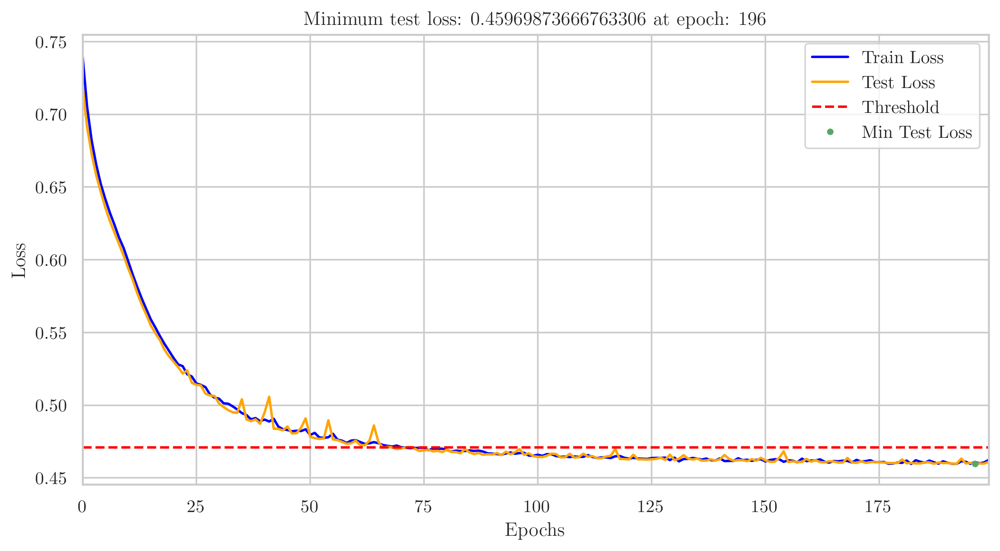

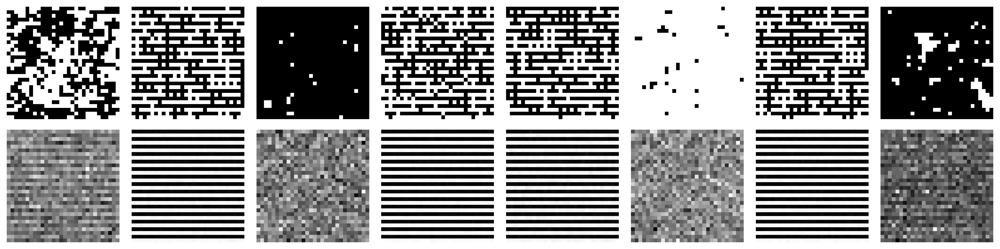

In [3]:

now = datetime.now()
folder_name = data_dir+"checkpoints/Autoencoder/"+now.strftime("%Y-%m-%d_%H-%M-%S")
# optimizer = torch.optim.Adam(model.parameters(), lr=); epochs = 400
optimizer = torch.optim.SGD(model.parameters(), lr=0.002, momentum=0.9, weight_decay=0); epochs = 200
trainArr1, testArr1 = trainAndTest(model,trainLoader,testLoader,criterion,optimizer,folder_name,epochs,saving=False)
plotLosses(trainArr1, testArr1, epochs=epochs, minX=0, maxX=epochs-1)
visualize_reconstruction(model, testLoader)

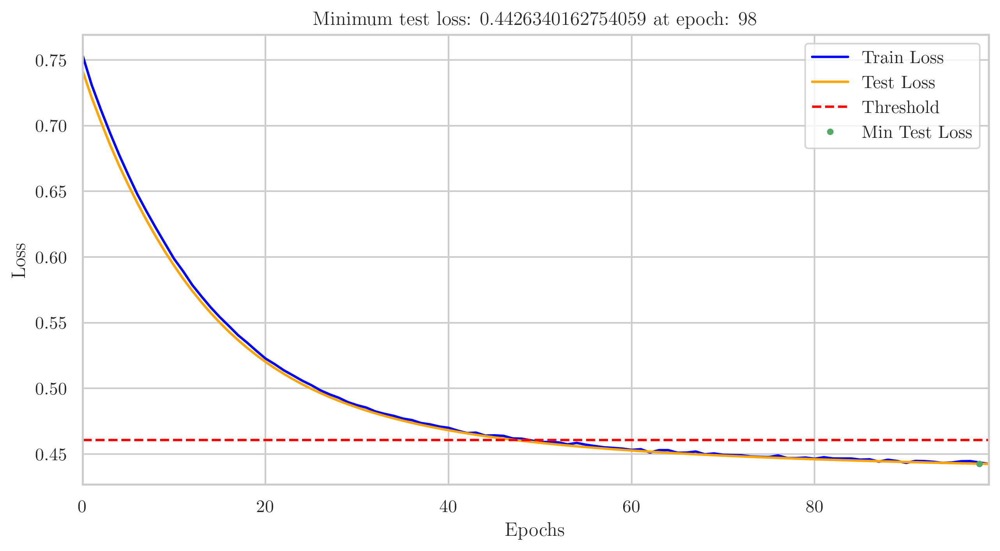

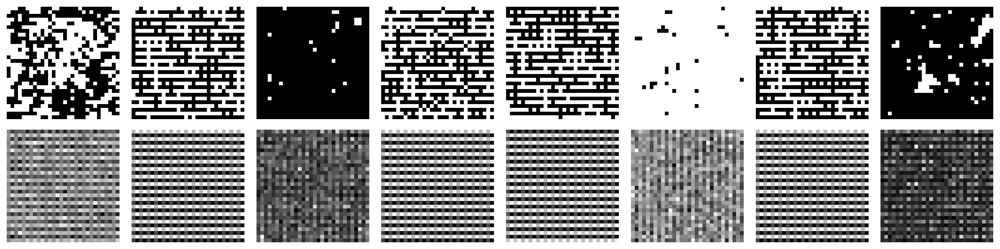

In [19]:
optimizer = torch.optim.SGD(model.parameters(), lr=0.002, momentum=0.9, weight_decay=0); epochs = 100
trainArr1, testArr1 = trainAndTest(model, trainLoader, testLoader, criterion, optimizer, num_epochs=epochs, saving=False)
plotLosses(trainArr1, testArr1, epochs=epochs, minX=0, maxX=epochs-1)
visualize_reconstruction(model, testLoader)

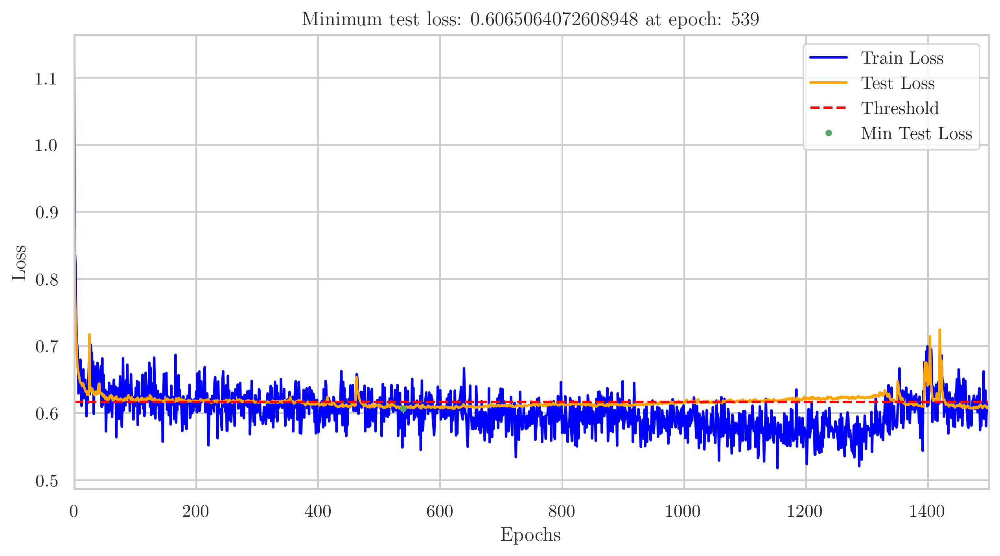

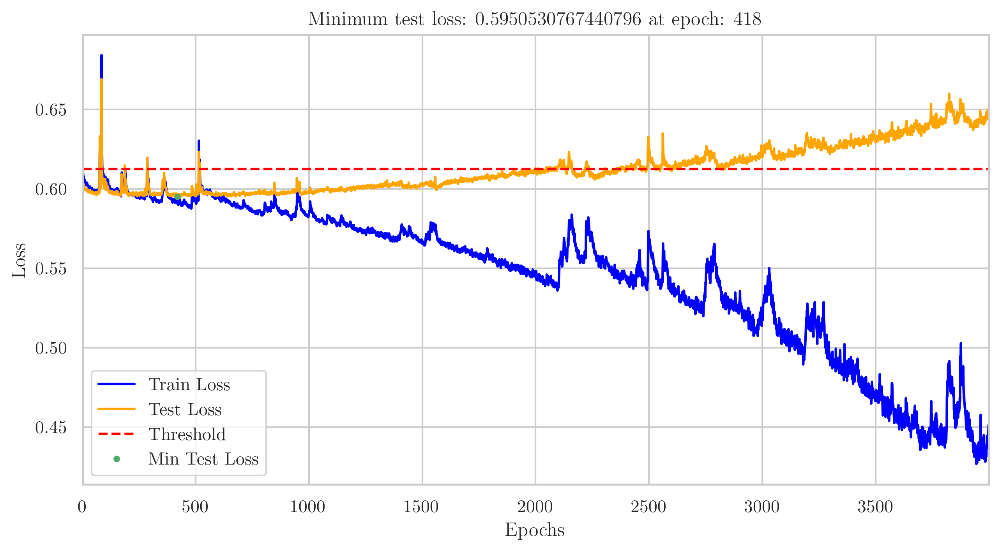

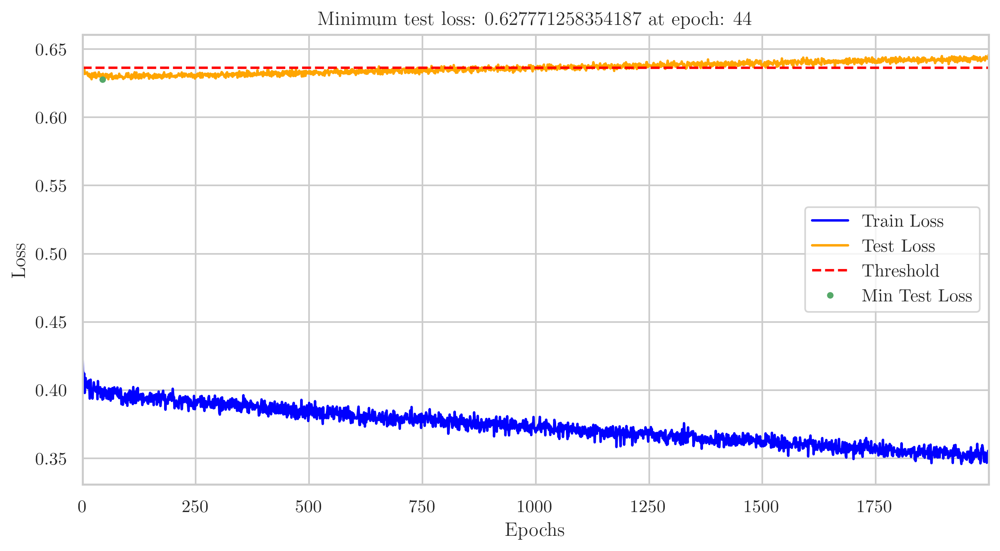

In [ ]:
seed = 483482923932993232
manualSeed(seed)

now = datetime.now()
folder_name = data_dir+"checkpoints/Autoencoder/"+now.strftime("%Y-%m-%d_%H-%M-%S")


batchSize = 128
criterion = nn.MSELoss()# nn.BCELoss()#
# model = AutoencoderCNN(2)
model = custNN.Autoencoder([900, 750, 600, 450, 300, 150, 75, 30, 10, 2], nn.Tanh(), nn.Tanh())
custNN.initialize_weights(model); model.to(device)

class ReshapeTransform:
    def __init__(self, shape):
        self.shape = shape

    def __call__(self, x):
        return x.view(*self.shape)
# transform = ReshapeTransform((1, side, side))  # Reshape to (1, 30, 30) for grayscale images
transform = v2.Compose([v2.RandomHorizontalFlip(),
                        v2.RandomVerticalFlip(),
                        ReshapeTransform([side*side]),
                        v2.Lambda(lambda x: 2*x - 1)])# None 
trainset = ds.CustomAutoencoderDataset(data_dir+"train", side, transform)
smallTrainset = ds.CustomAutoencoderDataset(data_dir+"small", side, transform)
tinyset = ds.CustomAutoencoderDataset(data_dir+"tiny", side, transform)
testset = ds.CustomAutoencoderDataset(data_dir+"test", side, transform)
trainLoader = torch.utils.data.DataLoader(trainset, batch_size=batchSize, shuffle=True, num_workers=4)
smallTrainLoader = torch.utils.data.DataLoader(smallTrainset, batch_size=batchSize, shuffle=True, num_workers=4)
tinyLoader = torch.utils.data.DataLoader(tinyset, batch_size=batchSize, shuffle=True, num_workers=4)
testLoader = torch.utils.data.DataLoader(testset, batch_size=batchSize, shuffle=False)

# Loss function and optimizer

optimizer = torch.optim.Adam(model.parameters(), lr=5e-4); epochs = 1500; saving = True
trainArr1, testArr1 = trainAndTest(model, tinyLoader, testLoader, criterion, optimizer, folder_name+'/1/', num_epochs=epochs, saving=saving)
plotLosses(trainArr1, testArr1, epochs=epochs, minX=0, maxX=epochs-1)
np.save(folder_name+'/1/'+'trainLosses.npy', trainArr1)
np.save(folder_name+'/1/'+'testLosses.npy', testArr1)

# torch.save(model.state_dict(), data_dir+"checkpoints/Autoencoder/modelExact1.pth")

optimizer = torch.optim.Adam(model.parameters(), lr=5e-4); epochs = 4000
trainArr2, testArr2 = trainAndTest(model, smallTrainLoader, testLoader, criterion, optimizer, folder_name+'/2/', num_epochs=epochs, saving=saving)
plotLosses(trainArr2, testArr2, epochs=epochs, minX=0, maxX=epochs-1)
np.save(folder_name+'/2/'+'trainLosses.npy', trainArr2)
np.save(folder_name+'/2/'+'testLosses.npy', testArr2)

# torch.save(model.state_dict(), data_dir+"checkpoints/Autoencoder/modelExact2.pth")

optimizer = torch.optim.Adam(model.parameters(), lr=5e-5); epochs = 2000
trainArr3, testArr3 = trainAndTest(model, smallTrainLoader, testLoader, criterion, optimizer, folder_name+'/3/', num_epochs=epochs, saving=saving)
plotLosses(trainArr3, testArr3, epochs=epochs, minX=0, maxX=epochs-1)
np.save(folder_name+'/3/'+'trainLosses.npy', trainArr3)
np.save(folder_name+'/3/'+'testLosses.npy', testArr3)

# torch.save(model.state_dict(), data_dir+"checkpoints/Autoencoder/modelExact3.pth")

In [13]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
import torchDatasets as ds
import networks as custNN

sns.set_theme(style='whitegrid')

plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Computer Modern Roman']
plt.rcParams['figure.dpi']= 300

import torch
import torch.nn as nn
from torchvision.transforms import v2


# Device configuration
device = 'cpu' #torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# def manualSeed(seed:int):
#     torch.manual_seed(seed)
#     torch.cuda.manual_seed(seed)
#     torch.cuda.manual_seed_all(seed)
#     torch.backends.cudnn.deterministic = True
#     torch.backends.cudnn.benchmark = False
side = 30
base_dir = '/home/shashank/Code/gonihedric/'; data_dir = base_dir + "data/"; date= "2025-06-19_08-40-39";

2025-06-19_08-40-39 and 1st part of training
Epoch 60; $\varepsilon=0.025$
Phase Diagram decent

Local minimum at epoch 18: 0.455299437046051
Local minimum at epoch 19: 0.4543357491493225
Local minimum at epoch 22: 0.5294175148010254
Local minimum at epoch 35: 0.5265287756919861
Local minimum at epoch 39: 0.5474183559417725
Local minimum at epoch 54: 0.4684698283672333
Local minimum at epoch 68: 0.4632880687713623
Local minimum at epoch 160: 0.5913580656051636
Local minimum at epoch 161: 0.5842579007148743


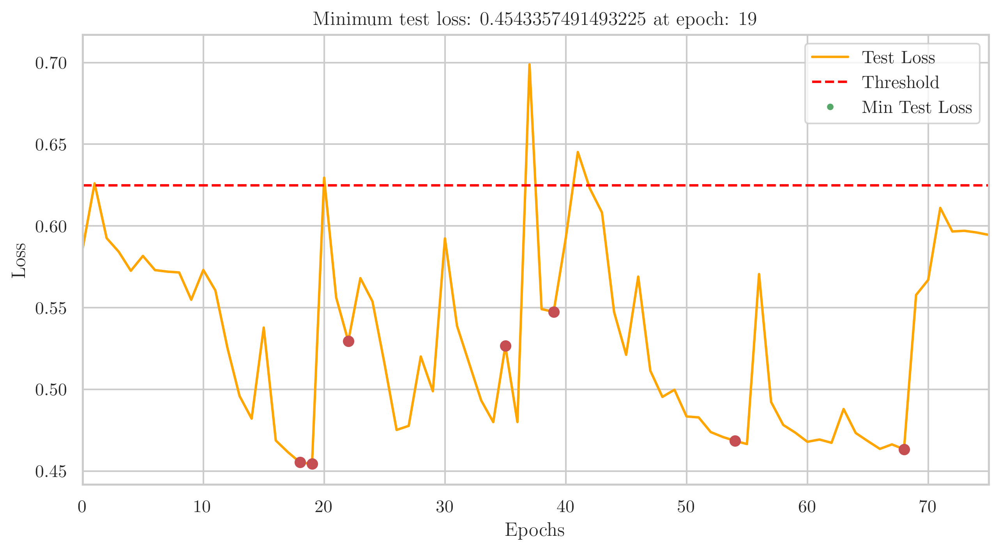

In [74]:
test = np.load(data_dir+"checkpoints/Autoencoder/"+date+"/2/testLosses.npy")
# plot and mark all the local minima
plt.figure(figsize=(10, 5))
plt.plot(test, label='Test Loss', color='orange')
plt.hlines(y=test[20:].mean(), xmin=0, xmax=len(test)-1, color='red', linestyle='--', label='Threshold')
plt.title(f"Minimum test loss: {np.min(test)} at epoch: {np.argmin(test)}")
plt.plot(np.argmin(test), test[np.argmin(test)], 'g.', label='Min Test Loss')
threshold = 0.1; points = 2
for i in range(points, len(test)-points):
    if (test[i-points] - test[i] > threshold) or (test[i+points] - test[i]>threshold):
        plt.plot(i, test[i], 'ro')  # Mark local minima with red dots
        print(f"Local minimum at epoch {i}: {test[i]}")

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.xlim(0, len(test)-1)
# plt.ylim(np.min(trainArr), np.max(test[20:])+0.001
plt.legend()
# plt.grid()
# plt.savefig(data_dir + "checkpoints/Autoencoder/loss_plot.png")
plt.xlim(0, 75)
plt.show()

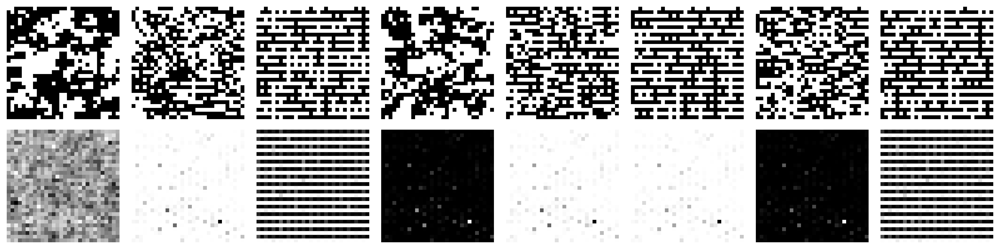

In [75]:

model = custNN.Autoencoder([900, 750, 600, 450, 300, 150, 75, 30, 10, 2], nn.Tanh(), nn.Tanh())
model.load_state_dict(torch.load(data_dir+f"checkpoints/Autoencoder/"+date+"/2/model_epoch_60.pth", map_location=device))
# model.load_state_dict(torch.load(data_dir+f"checkpoints/Autoencoder/model.pth", map_location=device))

def visualize_reconstruction(model, data_loader):
    model.eval()
    with torch.no_grad():
        images, _ = next(iter(data_loader))
        images = images.to(device)
        reconstructed = model(images)

        # Plot original vs reconstructed images
        fig, axes = plt.subplots(2, 8, figsize=(15, 4))
        for i in range(8):
            # Original images
            axes[0,i].imshow(images[i].cpu().numpy().squeeze().reshape(30, 30), cmap='gray')
            axes[0,i].axis('off')

            # Reconstructed images
            axes[1,i].imshow(reconstructed[i].cpu().numpy().squeeze().reshape(30, 30), cmap='gray')
            axes[1,i].axis('off')

        plt.tight_layout()
        plt.show()
        


transform = v2.Compose([v2.Lambda(lambda x: 2*x - 1)])#  None#
trainset = ds.CustomAutoencoderDataset(data_dir+"train", side, transform)
data_loader = torch.utils.data.DataLoader(trainset, batch_size=4000, shuffle=True)

visualize_reconstruction(model, data_loader)
# visualize_reconstruction(model,  smallTrainLoader)

    

In [57]:

transform = v2.Compose([v2.Lambda(lambda x: 2*x - 1)])#  None#
trainset = ds.CustomAutoencoderDataset(data_dir+"tiny", side, transform)
data_loader = torch.utils.data.DataLoader(trainset, batch_size=1400, shuffle=True)
#calculate test loss
total_loss = 0
criterion = nn.MSELoss()
model.eval()
with torch.no_grad():
    for inputs, _ in data_loader:
        inputs = inputs.to(device)
        outputs = model(inputs)
        loss = criterion(outputs, inputs).cpu().numpy()
        total_loss += loss
print(f"Test Loss: {total_loss / len(data_loader)}")

Test Loss: 0.017767097800970078


In [ ]:

configs = []
model.eval()
with torch.no_grad():
    # Get a batch of data
    configs, params = next(iter(data_loader))
    # images = images.numpy()
    configs = configs.to(device)
    # Pass images through encoder to get latent vectors
    latent_vectors = model.encoder(configs.view(configs.size(0), -1)).cpu().numpy()
    configs = configs.cpu().numpy()
    params = params.cpu().numpy()

In [20]:
transform = None
smallset = ds.CustomAutoencoderDataset(data_dir+"small", side, transform)
trainset = ds.CustomAutoencoderDataset(data_dir+"train", side, transform)
tinyset = ds.CustomAutoencoderDataset(data_dir+"tiny", side, transform)
testset = ds.CustomAutoencoderDataset(data_dir+"test", side, transform)
data_loader = torch.utils.data.DataLoader(smallset, batch_size=1400, shuffle=False)

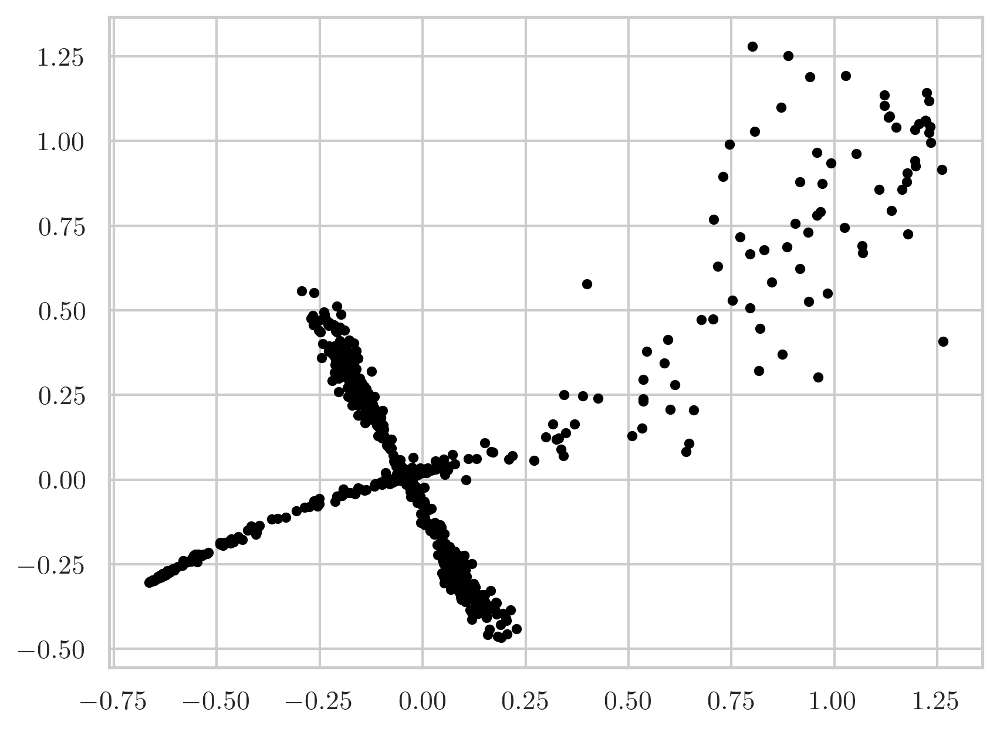

PCA components: (1400, 2)
Nearest Neighbours distances: (1400,)


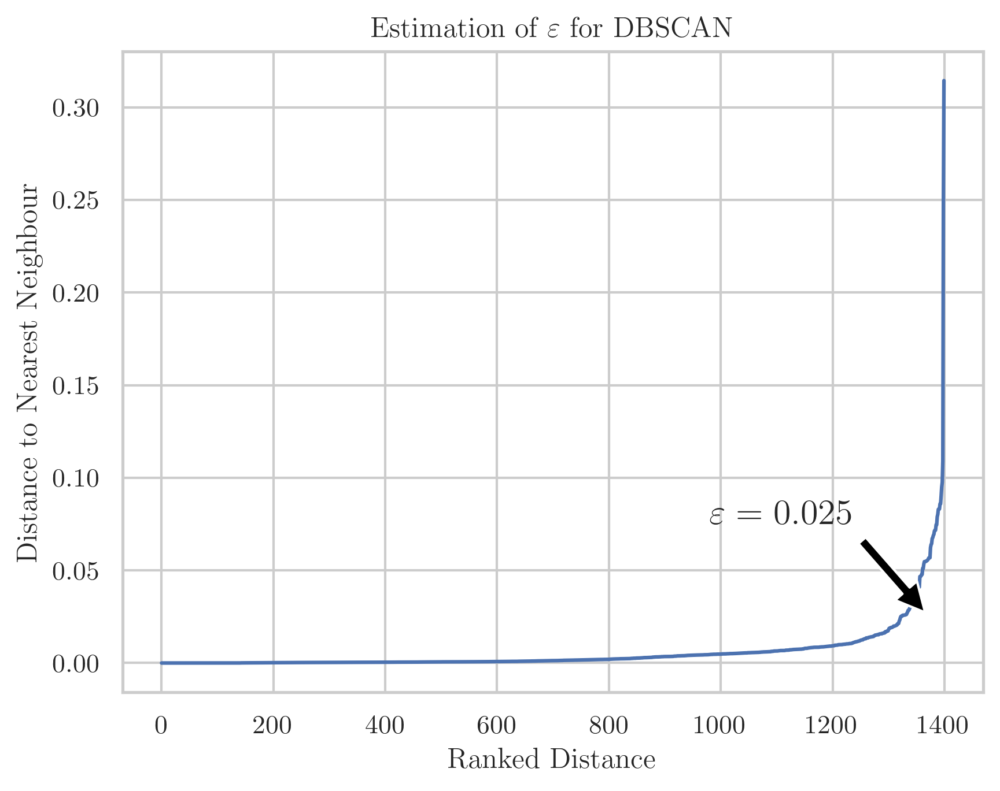

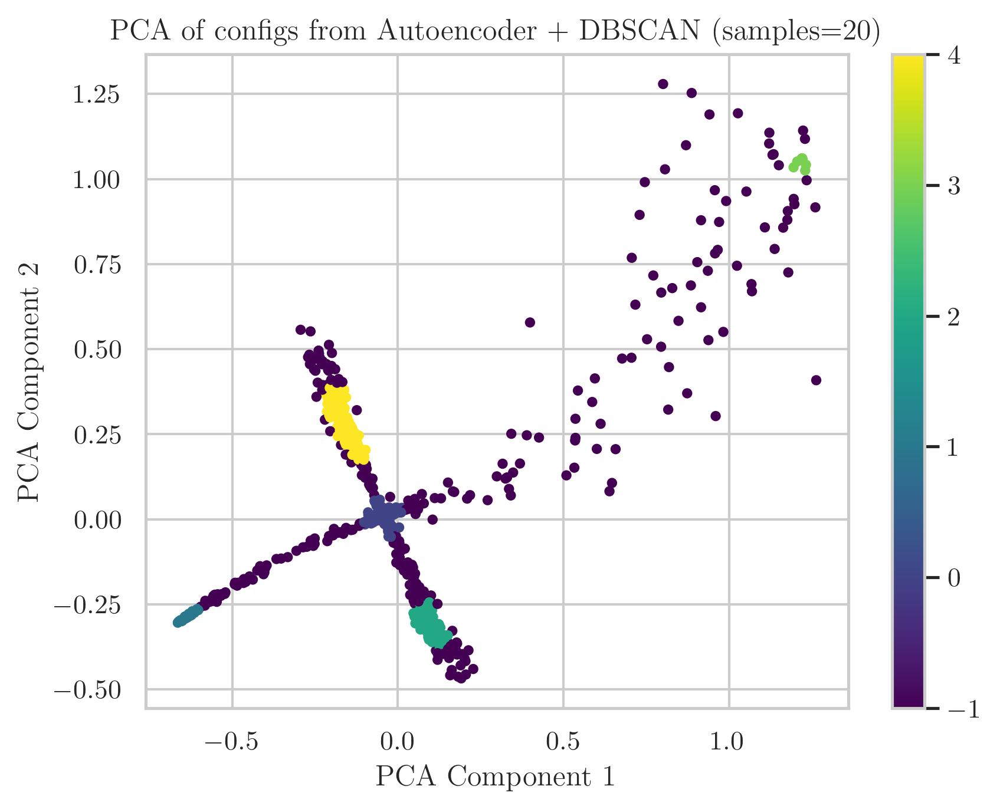

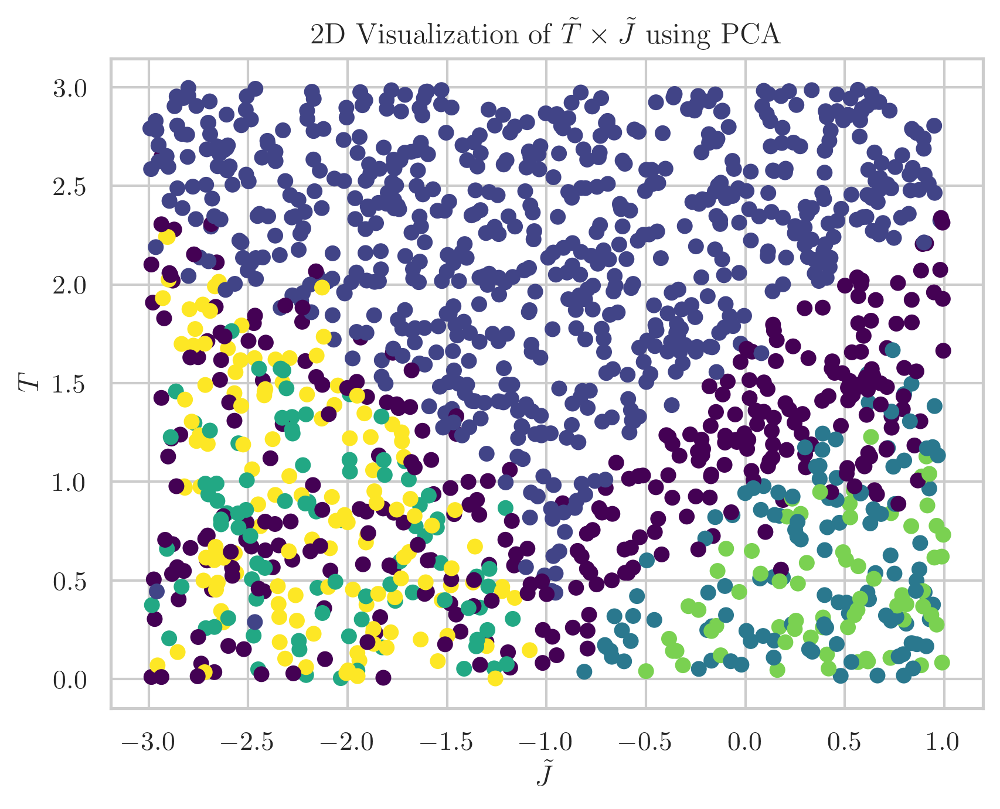

In [ ]:
configs = []
model.eval()
with torch.no_grad():
    # Get a batch of data
    configs, params = next(iter(data_loader))
    # images = images.numpy()
    configs = configs.to(device)
    # Pass images through encoder to get latent vectors
    latent_vectors = model.encoder(configs.view(configs.size(0), -1)).cpu().numpy()
    configs = configs.cpu().numpy()
    params = params.cpu().numpy()


# # Apply t-SNE to reduce latent space to 2D, default perplexity = 30
# # tsne = TSNE(n_components=2, random_state=42, perplexity=10)
# # tSNE_2d = tsne.fit_transform(latent_vectors)


# # pca = PCA(n_components=2)
# # pca_NN = pca.fit_transform(latent_vectors)
# # pca_Raw = pca.fit_transform(configs.reshape(configs.shape[0], -1))


# # plt.plot(tSNE_2d[:, 0], tSNE_2d[:, 1], 'o', markersize=1, alpha=0.5, label='t-SNE')


L1 = latent_vectors[:, 0]; L2 = latent_vectors[:, 1]
plt.scatter(L1, L2, s=10, c='black', label='PCA (NN)')
plt.show()
print("PCA components:", latent_vectors.shape)

neighbours = NearestNeighbors(n_neighbors=10)
neighbours_fit2 = neighbours.fit(latent_vectors)
distances2,_ = neighbours_fit2.kneighbors(latent_vectors)

distances2 = np.sort(distances2, axis=0)
distances2 = distances2[:, 1]  # Exclude the first column (distance to itself)
print("Nearest Neighbours distances:", distances2.shape)

# plt.plot(distances2, label='Nearest Neighbours Distance')
# plt.title(r'Estimation of $\varepsilon$ for DBSCAN')
# plt.xlabel('Ranked Distance')
# plt.ylabel('Distance to Nearest Neighbour')
# # plt.annotate(r'$\varepsilon=1$', xy=(1350, 1), xytext=(1100, 1.5),
# #              arrowprops=dict(facecolor='black', shrink=0.05),
# #              fontsize=15)
# plt.show()


# # coordinate transformation
# L1 = latent_vectors[:, 0]*np.cos(latent_vectors[:, 1]); L2 = latent_vectors[:, 0]*np.sin(latent_vectors[:, 1])
# aeTrans = np.column_stack((L1, L2))

# plt.scatter(L1, L2, s=10, c='black', label='Autoencoder Latent Space')
# plt.show()

# # neighbours = NearestNeighbors(n_neighbors=10)
# neighbours_fit2 = neighbours.fit(aeTrans)
# distances2,_ = neighbours_fit2.kneighbors(aeTrans)

# distances2 = np.sort(distances2, axis=0)
# distances2 = distances2[:, 1]  # Exclude the first column (distance to itself)



epsilon = 0.025
min_samples = 20
dbscan2 = DBSCAN(eps=epsilon, min_samples=min_samples)
labels2 = dbscan2.fit_predict(latent_vectors)


plt.plot(distances2, label='Nearest Neighbours Distance')
plt.title(r'Estimation of $\varepsilon$ for DBSCAN')
plt.xlabel('Ranked Distance')
plt.ylabel('Distance to Nearest Neighbour')
plt.annotate(rf'$\varepsilon={epsilon}$', xy=(data_loader.batch_size*0.98, epsilon), xytext=(data_loader.batch_size*0.7, epsilon+0.05),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=15)
# plt.ylim(0.05, 0.3)
# plt.xlim(1000, 1400)
plt.show()

scatter2 = plt.scatter(L1, L2, c=labels2, cmap='viridis', s=10)
plt.colorbar(scatter2)
plt.title("PCA of configs from Autoencoder + DBSCAN (samples="+str(min_samples)+")")
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
# plt.legend()
plt.show()



plt.scatter(params[:, 0], params[:,1], c=labels2, cmap='viridis', s=30)
# plt.colorbar(scatter, ticks=range(10), label='PCA of Latent Space')
plt.title(r'2D Visualization of $\tilde{T} \times \tilde{J}$ using PCA')
plt.xlabel(r'$\tilde{J}$')
plt.ylabel(r'$T$')
plt.show()


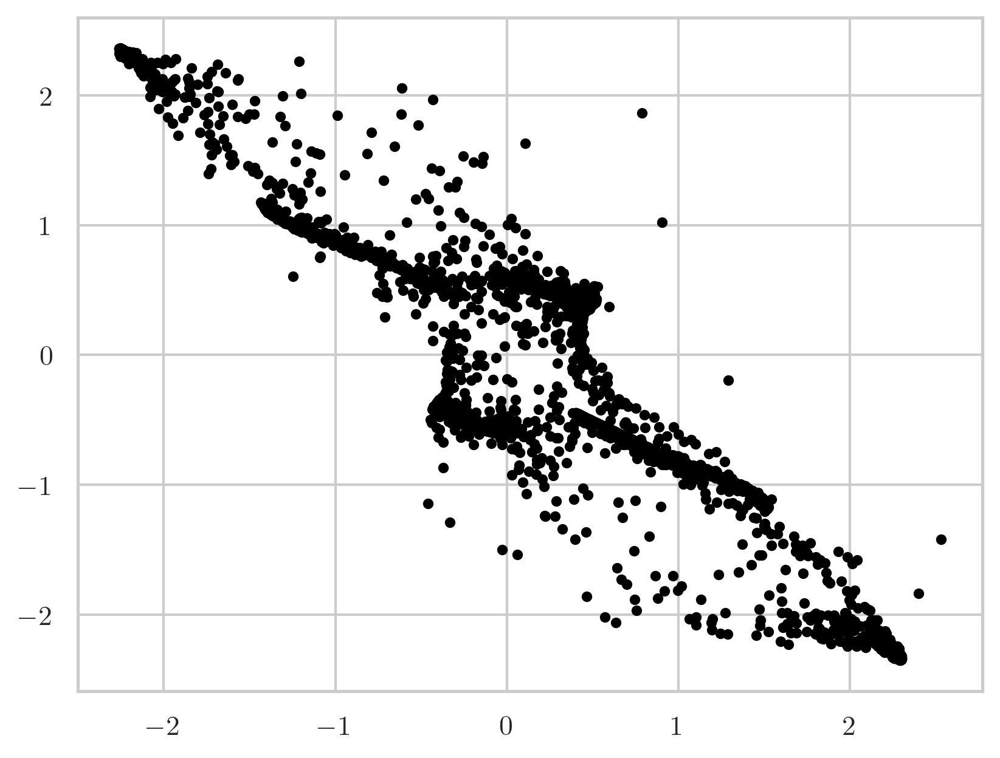

PCA components: (4000, 2)
Nearest Neighbours distances: (4000,)


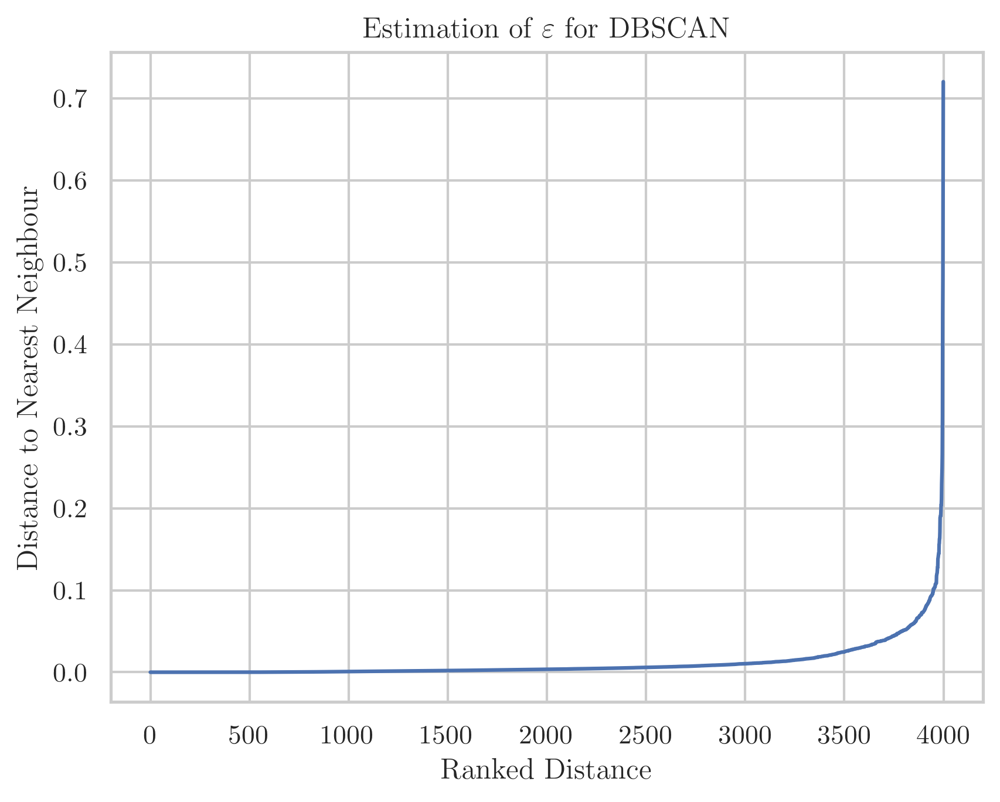

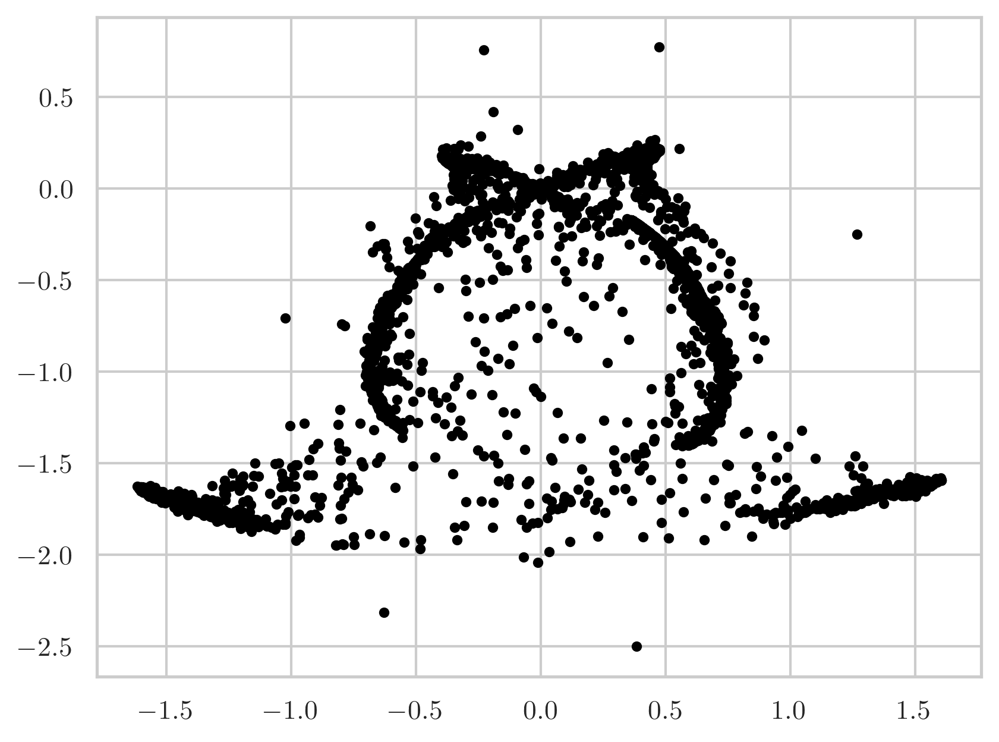

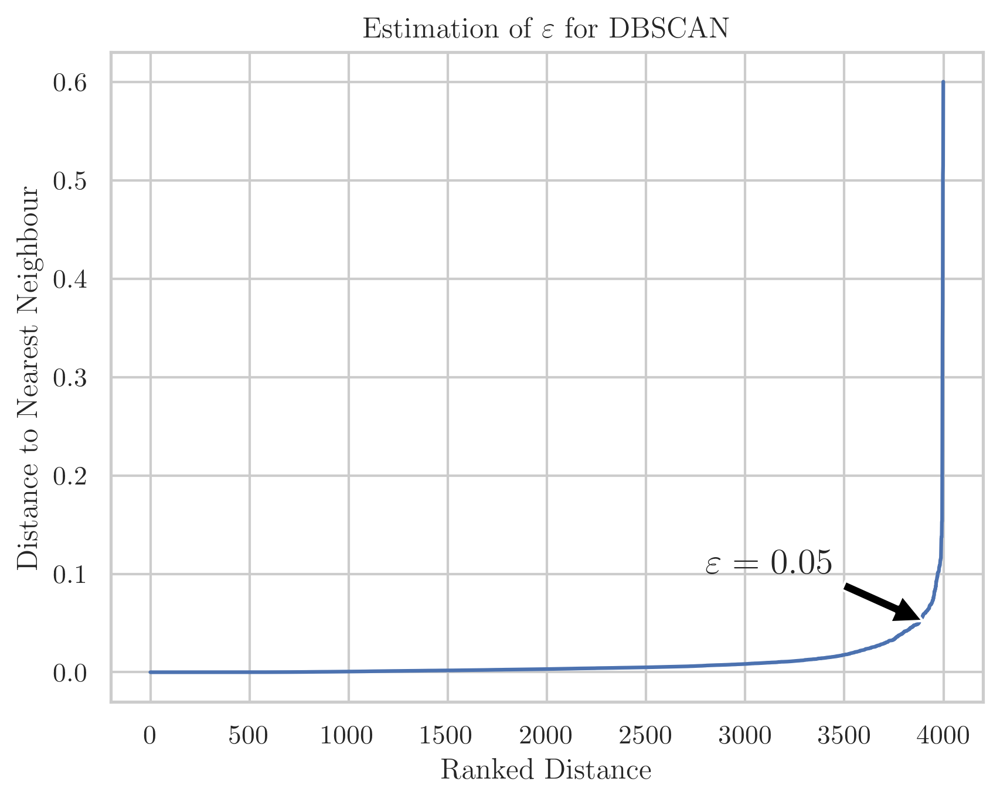

In [84]:
# # Apply t-SNE to reduce latent space to 2D, default perplexity = 30
# # tsne = TSNE(n_components=2, random_state=42, perplexity=10)
# # tSNE_2d = tsne.fit_transform(latent_vectors)


# # pca = PCA(n_components=2)
# # pca_NN = pca.fit_transform(latent_vectors)
# # pca_Raw = pca.fit_transform(configs.reshape(configs.shape[0], -1))


# # plt.plot(tSNE_2d[:, 0], tSNE_2d[:, 1], 'o', markersize=1, alpha=0.5, label='t-SNE')


L1 = latent_vectors[:, 0]; L2 = latent_vectors[:, 1]
plt.scatter(L1, L2, s=10, c='black', label='PCA (NN)')
plt.show()
print("PCA components:", latent_vectors.shape)

neighbours = NearestNeighbors(n_neighbors=10)
neighbours_fit2 = neighbours.fit(latent_vectors)
distances2,_ = neighbours_fit2.kneighbors(latent_vectors)

distances2 = np.sort(distances2, axis=0)
distances2 = distances2[:, 1]  # Exclude the first column (distance to itself)
print("Nearest Neighbours distances:", distances2.shape)

plt.plot(distances2, label='Nearest Neighbours Distance')
plt.title(r'Estimation of $\varepsilon$ for DBSCAN')
plt.xlabel('Ranked Distance')
plt.ylabel('Distance to Nearest Neighbour')
# plt.annotate(r'$\varepsilon=1$', xy=(1350, 1), xytext=(1100, 1.5),
#              arrowprops=dict(facecolor='black', shrink=0.05),
#              fontsize=15)
plt.show()


# coordinate transformation
L1 = latent_vectors[:, 0]*np.cos(latent_vectors[:, 1]); L2 = latent_vectors[:, 0]*np.sin(latent_vectors[:, 1])
aeTrans = np.column_stack((L1, L2))

plt.scatter(L1, L2, s=10, c='black', label='Autoencoder Latent Space')
plt.show()

# neighbours = NearestNeighbors(n_neighbors=10)
neighbours_fit2 = neighbours.fit(aeTrans)
distances2,_ = neighbours_fit2.kneighbors(aeTrans)

distances2 = np.sort(distances2, axis=0)
distances2 = distances2[:, 1]  # Exclude the first column (distance to itself)



epsilon = 0.05
min_samples = 20
dbscan2 = DBSCAN(eps=epsilon, min_samples=min_samples)
labels2 = dbscan2.fit_predict(latent_vectors)


plt.plot(distances2, label='Nearest Neighbours Distance')
plt.title(r'Estimation of $\varepsilon$ for DBSCAN')
plt.xlabel('Ranked Distance')
plt.ylabel('Distance to Nearest Neighbour')
plt.annotate(rf'$\varepsilon={epsilon}$', xy=(data_loader.batch_size*0.98, epsilon), xytext=(data_loader.batch_size*0.7, epsilon+0.05),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=15)
# plt.ylim(0.05, 0.3)
# plt.xlim(1000, 1400)
plt.show()

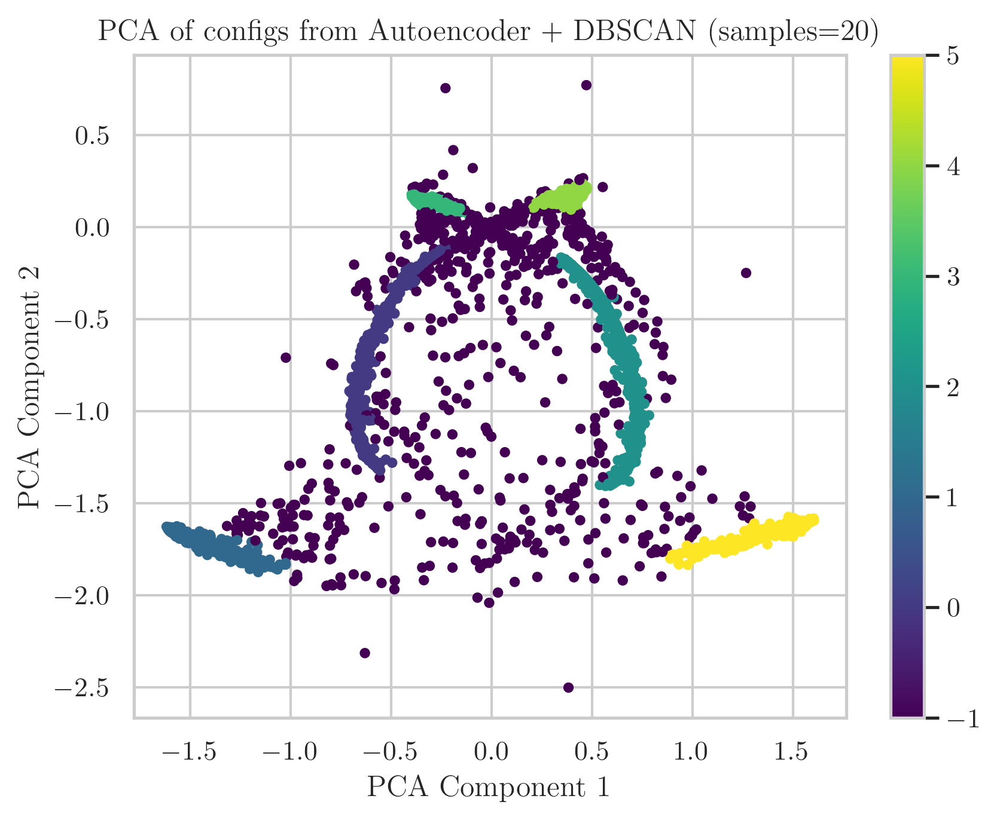

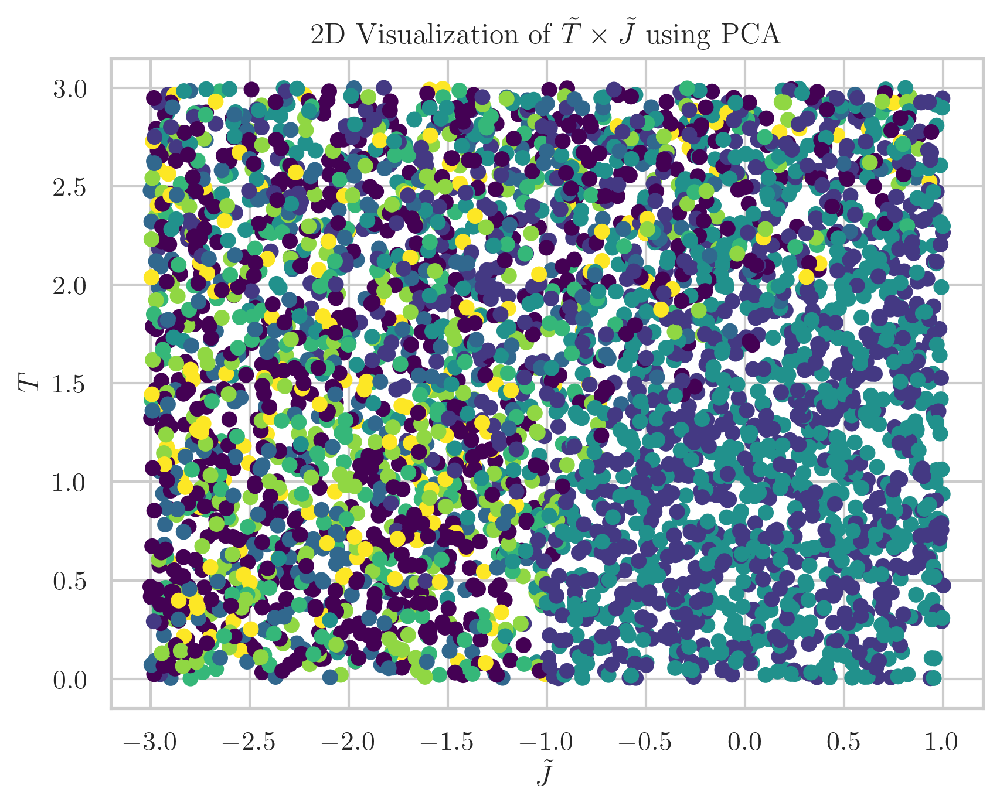

In [85]:
scatter2 = plt.scatter(L1, L2, c=labels2, cmap='viridis', s=10)
plt.colorbar(scatter2)
plt.title("PCA of configs from Autoencoder + DBSCAN (samples="+str(min_samples)+")")
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
# plt.legend()
plt.show()



plt.scatter(params[:, 0], params[:,1], c=labels2, cmap='viridis', s=30)
# plt.colorbar(scatter, ticks=range(10), label='PCA of Latent Space')
plt.title(r'2D Visualization of $\tilde{T} \times \tilde{J}$ using PCA')
plt.xlabel(r'$\tilde{J}$')
plt.ylabel(r'$T$')
plt.show()


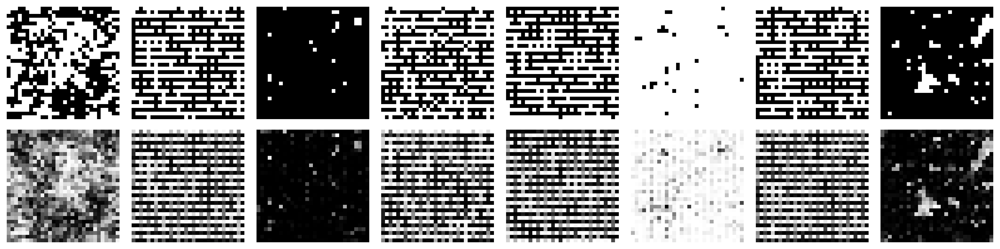

FileNotFoundError: [Errno 2] No such file or directory: '/home/shashank/Code/gonihedric/data/checkpoints/Autoencoder/2025-06-12_18/1/model_epoch_50.pth'

In [6]:

# model.load_state_dict(torch.load(data_dir+f"checkpoints/Autoencoder/2025-06-12_18/2/model_epoch_990.pth", map_location=device))
visualize_reconstruction(model, testLoader)
# visualize_reconstruction(model,  smallTrainLoader)


model.load_state_dict(torch.load(data_dir+f"checkpoints/Autoencoder/2025-06-12_18/1/model_epoch_50.pth", map_location=device))
visualize_reconstruction(model, testLoader)
# visualize_reconstruction(model,  smallTrainLoader)


In [15]:
# def with open(self.file + "lattice", 'r') as configs, open(self.file + self.scheme, 'r') as labels:
#             if idx >= self.length:
#                 raise IndexError
#             configs.seek(idx*self.configSeekSkip, os.SEEK_SET)
#             labels.seek(idx*self.dataSeekSkip, os.SEEK_SET)
#             label = self.labels(labels)
#             config = T.tensor(np.array(list(configs.readline().strip()), dtype=int)).type(T.float)
#             if self.transform:
#                 config = self.transform(config)
#             if self.target_transform:
#                 label = self.target_transform(label)
#             return (config, label)
import numpy as np
import matplotlib.pyplot as plt
L = 30
filename = '../bin/'
with open(filename + "lattice", 'r') as f, open(filename+'data', 'r') as l:
    lines = f.readlines()
    images = []; labels = []
    for line in lines:
        image = np.array(list(line.strip()), dtype=int).reshape(L, L)
        images.append(image)
        labels.append(np.fromstring(l.readline().strip(), dtype=float, sep=" "))
print(labels)

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
for i in range(3):
    # Original images
    axes[0,i].imshow(images[i].reshape(L,L), cmap='gray')
    axes[0,i].axis('off')
    axes[0,i].set_title(f'{labels[i]}')
    
    axes[1,i].imshow(images[i+3].reshape(L,L), cmap='gray')
    axes[1,i].axis('off')
    axes[1,i].set_title(f'{labels[i+3]}')

    axes[2,i].imshow(images[i+6].reshape(L,L), cmap='gray')
    axes[2,i].axis('off')
    axes[2,i].set_title(f'{labels[i+6]}')



# plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '../bin/lattice'

In [33]:
import numpy as np
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

sns.set(style='whitegrid')

plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Computer Modern Roman']
plt.rcParams['figure.dpi']= 300


def visualize_latent_space(model, dataset, perplexity=30, n_samples=5000):
    # Load the dataset
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=n_samples, shuffle=False)
    
    model.eval()
    with torch.no_grad():
        # Get a batch of data
        images, labels = next(iter(data_loader))
        # images = images.numpy()
        images = images.to(device)
        # Pass images through encoder to get latent vectors
        latent_vectors = model.encoder(images.view(images.size(0), -1)).cpu().numpy()
        labels = labels.numpy()
    
    # Apply t-SNE to reduce latent space to 2D, default perplexity = 30
    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity)
    latent_2d = tsne.fit_transform(latent_vectors)

    # Normalize labels to [0,1] for RGB mapping
    scaler = MinMaxScaler()
    # colors = scaler.fit_transform(latent_2d)  # shape (n_samples, 2)
    color_values = np.linalg.norm(latent_2d, axis=1)  # or labels[:,0]
    color_values = scaler.fit_transform(color_values.reshape(-1,1)).flatten()

    # Add a third channel (e.g. zeros or something derived)
    # colors_rgb = np.hstack([colors, np.zeros((colors.shape[0], 1))])  # RGB
    
    # Plot the 2D latent space with labels
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(labels[:, 0], labels[:,1], c=color_values, cmap='viridis', s=30)
    # plt.colorbar(scatter, ticks=range(10), label='Digit Labels')
    plt.title('2D Visualization of Latent Space using t-SNE')
    plt.xlabel(r'$\tilde{J}$')
    plt.ylabel(r'$T$')
    plt.show()

In [ ]:
#PCA visualisation of latent space
from sklearn.decomposition import PCA

def visualize_latent_space_pca(model, dataset, n_samples=5000):
    # Load the dataset
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=n_samples, shuffle=False)
    model.eval()
    with torch.no_grad():
        # Get a batch of data
        images, labels = next(iter(data_loader))
        images, labels = images[:n_samples], labels[:n_samples]  # Limit the number of samples
        images = images.to(device)

        # Pass images through encoder to get latent vectors
        latent_vectors = model.encoder(images.view(images.size(0), -1)).cpu().numpy()
        labels = labels.numpy()
    # Apply PCA to reduce latent space to 2D
    pca = PCA(n_components=2)
    latent_2d = pca.fit_transform(latent_vectors)

    scaler = MinMaxScaler()
    # colors = scaler.fit_transform(latent_2d)  # shape (n_samples, 2)
    color_values = np.linalg.norm(latent_2d, axis=1)  # or labels[:,0]
    color_values = scaler.fit_transform(color_values.reshape(-1,1)).flatten()

    # Add a third channel (e.g. zeros or something derived)
    # colors_rgb = np.hstack([colors, np.zeros((colors.shape[0], 1))])  # RGB
    
    # Plot the 2D latent space with labels
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(labels[:, 0], labels[:,1], c=color_values, cmap='viridis', s=30)
    # plt.colorbar(scatter, ticks=range(10), label='PCA of Latent Space')
    plt.title('2D Visualization of Latent Space using PCA')
    plt.xlabel(r'$\tilde{J}$')
    plt.ylabel(r'$T$')
    plt.show()

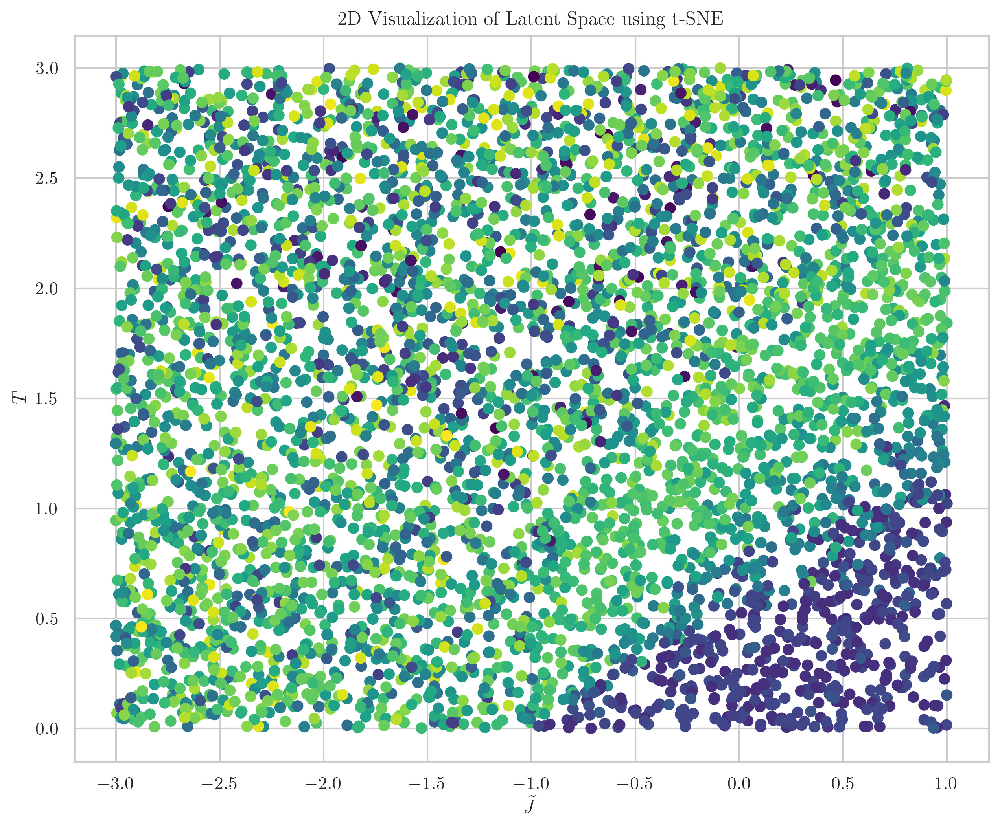

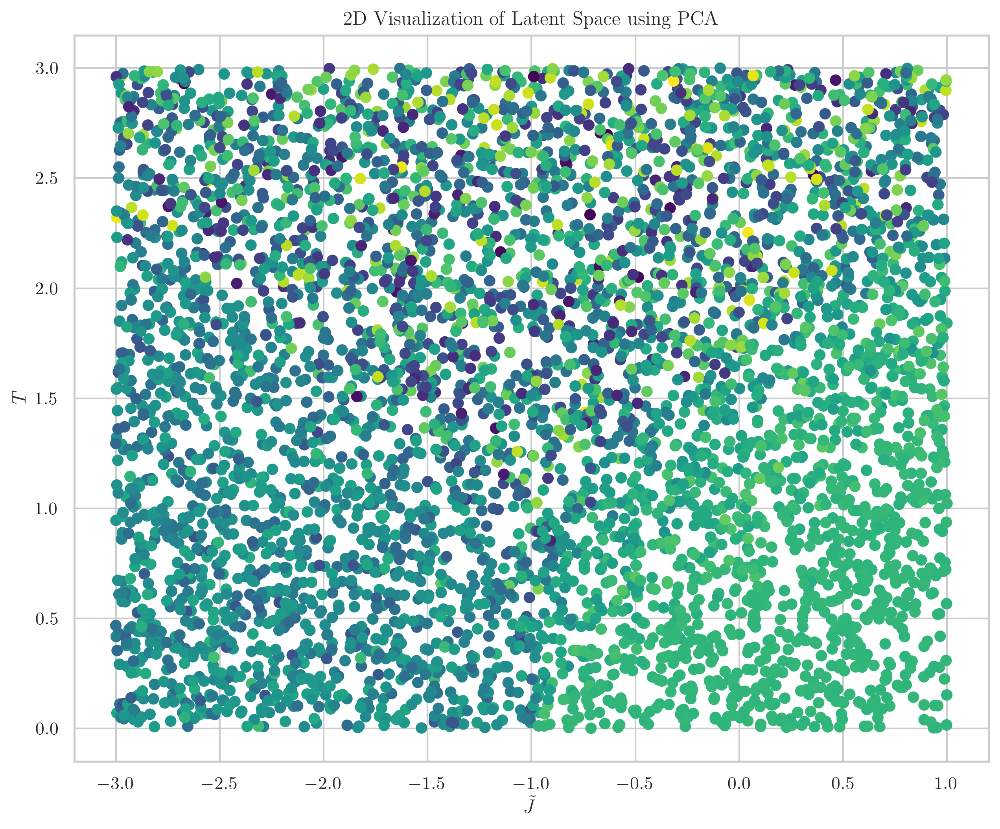

In [46]:

largeset = ds.CustomAutoencoderDataset(data_dir+"train", side, transform)

# Visualize the latent space
visualize_latent_space(model, largeset, 10, 5000)


# Visualize the latent space using PCA
visualize_latent_space_pca(model, largeset, 5000)

In [ ]:
#visualise ising lattice from file
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

L = 100
filename = '../bin/'
with open(filename + "lattice", 'r') as f, open(filename+'data', 'r') as l:
    lines = f.readlines()
    images = []; labels = []
    for line in lines:
        image = np.array(list(line.strip()), dtype=int).reshape(L, L)
        images.append(image)
        labels.append(np.fromstring(l.readline().strip(), dtype=float, sep=" "))
print(labels)
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
for i in range(3):
    # Original images
    axes[0,i].imshow(images[i].reshape(L,L), cmap='gray')
    axes[0,i].axis('off')
    axes[0,i].set_title(f'{labels[i]}')
    
    axes[1,i].imshow(images[i+3].reshape(L,L), cmap='gray')
    axes[1,i].axis('off')
    axes[1,i].set_title(f'{labels[i+3]}')

    axes[2,i].imshow(images[i+6].reshape(L,L), cmap='gray')
    axes[2,i].axis('off')
    axes[2,i].set_title(f'{labels[i+6]}')
# plt.tight_layout()


FileNotFoundError: [Errno 2] No such file or directory: '../bin/lattice'

In [85]:
import numpy as np
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

sns.set(style='whitegrid')

plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Computer Modern Roman']
plt.rcParams['figure.dpi']= 300

import torch
import torch.nn as nn
import torch.optim as optim
import torchDatasets as ds
import networks as custNN
from torchvision.transforms import v2



# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

seed = 483482923932993232
base_dir = '/home/shashank/Code/gonihedric/'; data_dir = base_dir + "data/"

def manualSeed(seed:int):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
manualSeed(seed)

transform = v2.Compose([
    v2.Lambda(lambda x: 2*x - 1)
])

side = 30
testset = ds.CustomAutoencoderDataset(data_dir+"small", side, transform)
trainset = ds.CustomAutoencoderDataset(data_dir+"train", side, transform)

# Initialize model and move to device
# model = Autoencoder().to(device)
model = custNN.Autoencoder([900, 750, 600, 450, 300, 150, 75, 30, 10, 2], nn.Tanh(), nn.Tanh())
model.load_state_dict(torch.load(data_dir+"checkpoints/Autoencoder/modelPaperExact.pth", map_location=device))
model.to(device)

criterion = nn.MSELoss()

In [81]:

data_loader = torch.utils.data.DataLoader(trainset, batch_size=1400, shuffle=False)
configs = []
model.eval()
with torch.no_grad():
    # Get a batch of data
    configs, params = next(iter(data_loader))
    # images = images.numpy()
    configs = configs.to(device)
    # Pass images through encoder to get latent vectors
    latent_vectors = model.encoder(configs.view(configs.size(0), -1)).cpu().numpy()
    configs = configs.cpu().numpy()
    params = params.cpu().numpy()
    

# Apply t-SNE to reduce latent space to 2D, default perplexity = 30
tsne = TSNE(n_components=2, random_state=42, perplexity=10)
tSNE_2d = tsne.fit_transform(latent_vectors)


pca = PCA(n_components=2)
pca_NN = pca.fit_transform(latent_vectors)
pca_Raw = pca.fit_transform(configs.reshape(configs.shape[0], -1))


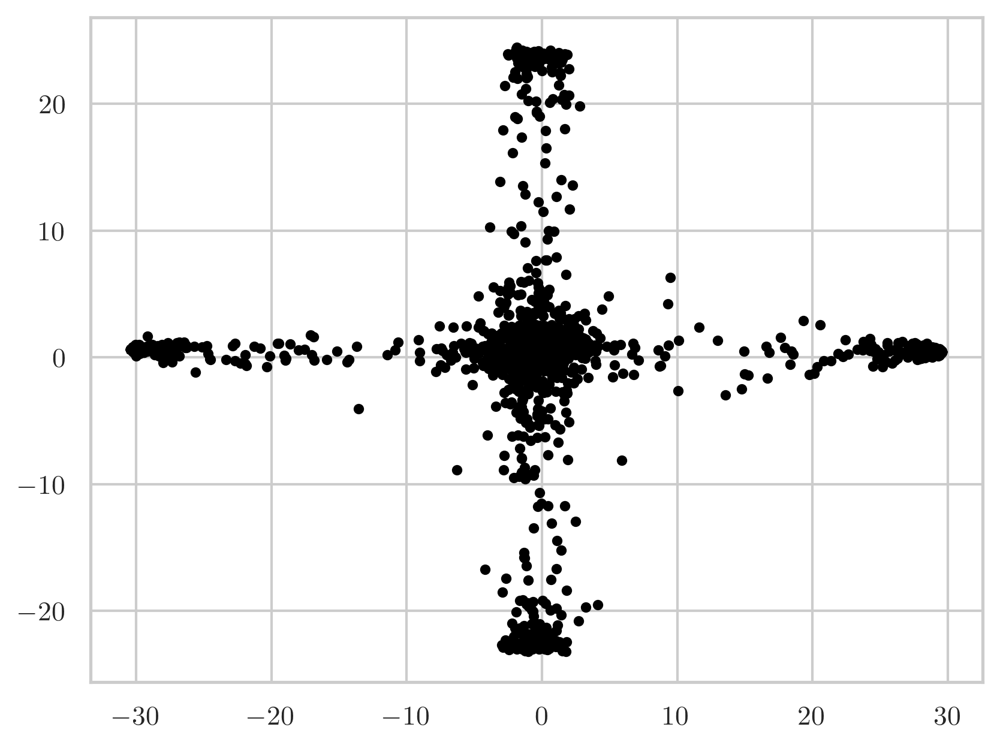

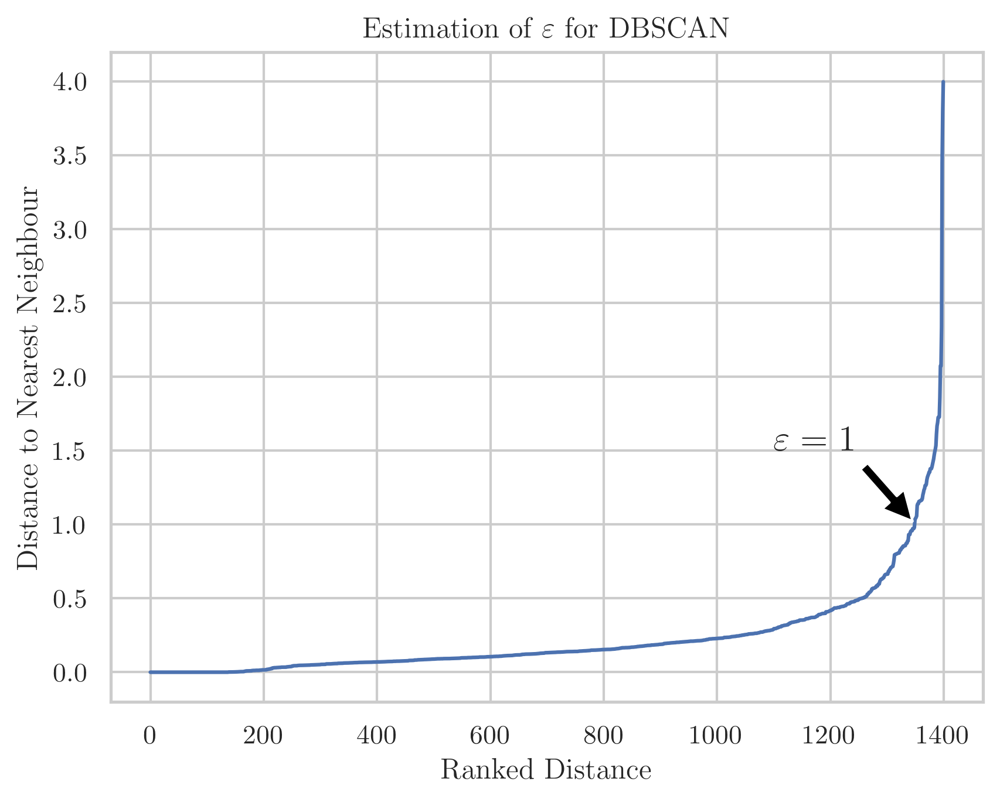

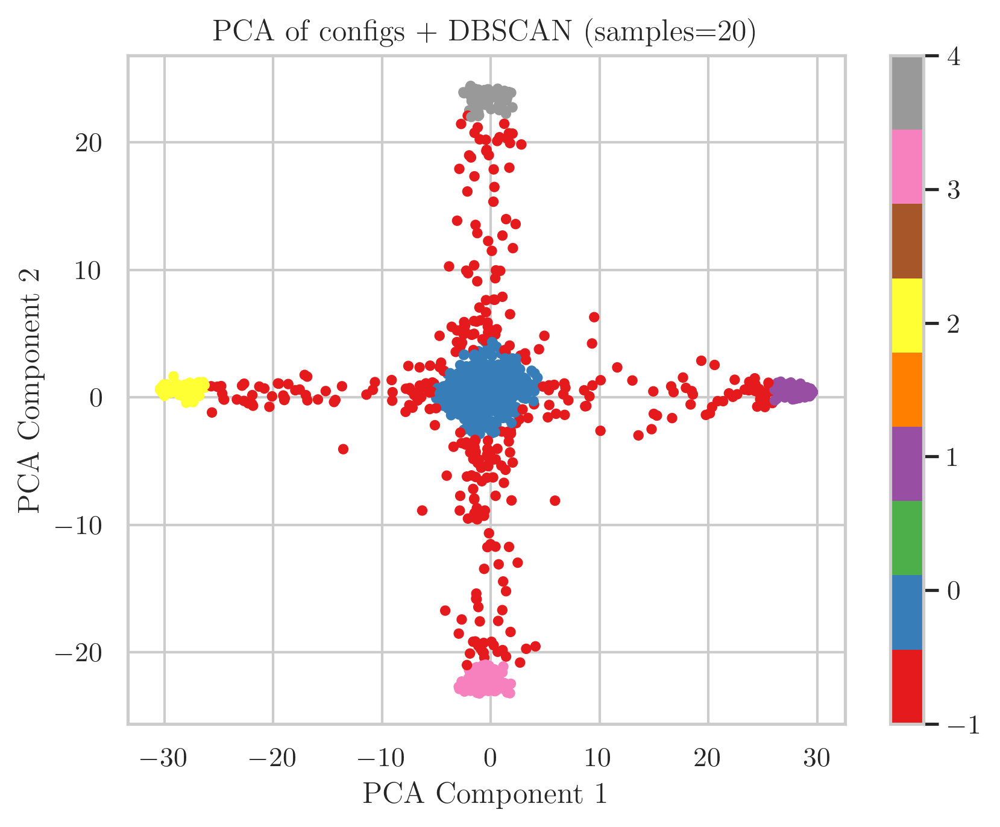

In [4]:
plt.scatter(pca_Raw[:, 0], pca_Raw[:, 1], s=10, c='black' ,label='PCA (Raw)')
plt.show()

neighbours = NearestNeighbors(n_neighbors=10)
neighbours_fit = neighbours.fit(pca_Raw)
distances,_ = neighbours_fit.kneighbors(pca_Raw)

distances = np.sort(distances, axis=0)
distances = distances[:, 1]  # Exclude the first column (distance to itself)

plt.plot(distances, label='Nearest Neighbours Distance')
plt.title(r'Estimation of $\varepsilon$ for DBSCAN')
plt.xlabel('Ranked Distance')
plt.ylabel('Distance to Nearest Neighbour')
plt.annotate(r'$\varepsilon=1$', xy=(1350, 1), xytext=(1100, 1.5),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=15)
# plt.xlim(1200, 1400)
# plt.ylim(0.5, 1.5)
plt.show()

epsilon = 1
min_samples = 20
dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)
labels = dbscan.fit_predict(pca_Raw)

scatter = plt.scatter(pca_Raw[:, 0], pca_Raw[:, 1], c=labels, cmap='Set1', s=10)
plt.colorbar(scatter)
plt.title("PCA of configs + DBSCAN (samples="+str(min_samples)+")")
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
# plt.legend()
plt.show()

In [86]:

def visualize_reconstruction(model, data_loader):
    model.eval()
    with torch.no_grad():
        images,_ = next(iter(data_loader))
        print(images.shape,images.dtype)
        images = images.to(device)
        reconstructed = model(images).cpu().numpy()

        # Plot original vs reconstructed images
        fig, axes = plt.subplots(2, 8, figsize=(15, 4))
        for i in range(8):
            # Original images
            axes[0,i].imshow(images[i].cpu().numpy().squeeze().reshape(30, 30), cmap='gray')
            axes[0,i].axis('off')

            # Reconstructed images
            axes[1,i].imshow(reconstructed[i].cpu().numpy().squeeze().reshape(30, 30), cmap='gray')
            axes[1,i].axis('off')

        plt.tight_layout()
        plt.show()
import utilsTrainTest as utt
transform = v2.Compose([
    v2.Lambda(lambda x: 2*x - 1),
    utt.ReshapeTransform([side*side])
])
visualize_reconstruction(model, data_loader)

torch.Size([1400, 1, 30, 30]) torch.float32


RuntimeError: mat1 and mat2 shapes cannot be multiplied (42000x30 and 900x750)

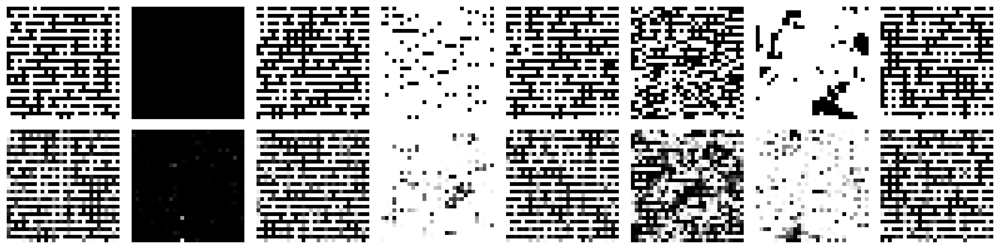

In [90]:
testset = ds.CustomAutoencoderDataset(data_dir+"train", side, transform)
data_loader = torch.utils.data.DataLoader(testset, batch_size=batchSize, shuffle=True)
images = []
model.eval()
with torch.no_grad():
    # Get a batch of data
    images,_ = next(iter(data_loader))
    # images = images.numpy()
    images = images.to(device)
    # Pass images through encoder to get latent vectors
    reconstructed = model.encoder(images.view(images.size(0), -1)).cpu().numpy()
    reconstructed = model.decoder(torch.tensor(reconstructed).to(device)).cpu().numpy()

    # Plot original vs reconstructed images
    fig, axes = plt.subplots(2, 8, figsize=(15, 4))
    for i in range(8):
        # Original images
        axes[0,i].imshow(images[i].cpu().numpy().squeeze().reshape(30, 30), cmap='gray')
        axes[0,i].axis('off')

        # Reconstructed images
        axes[1,i].imshow(reconstructed[i].squeeze().reshape(30, 30), cmap='gray')
        axes[1,i].axis('off')

    plt.tight_layout()
    plt.show()

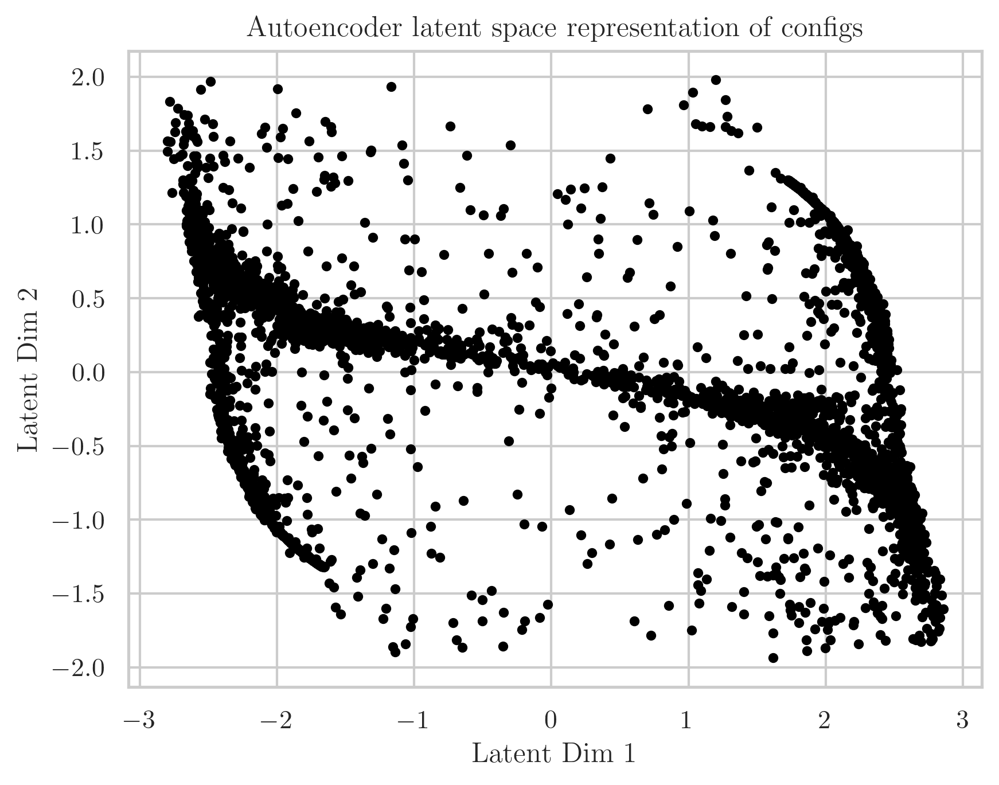

PCA components: (5000, 2)
Nearest Neighbours distances: (5000,)


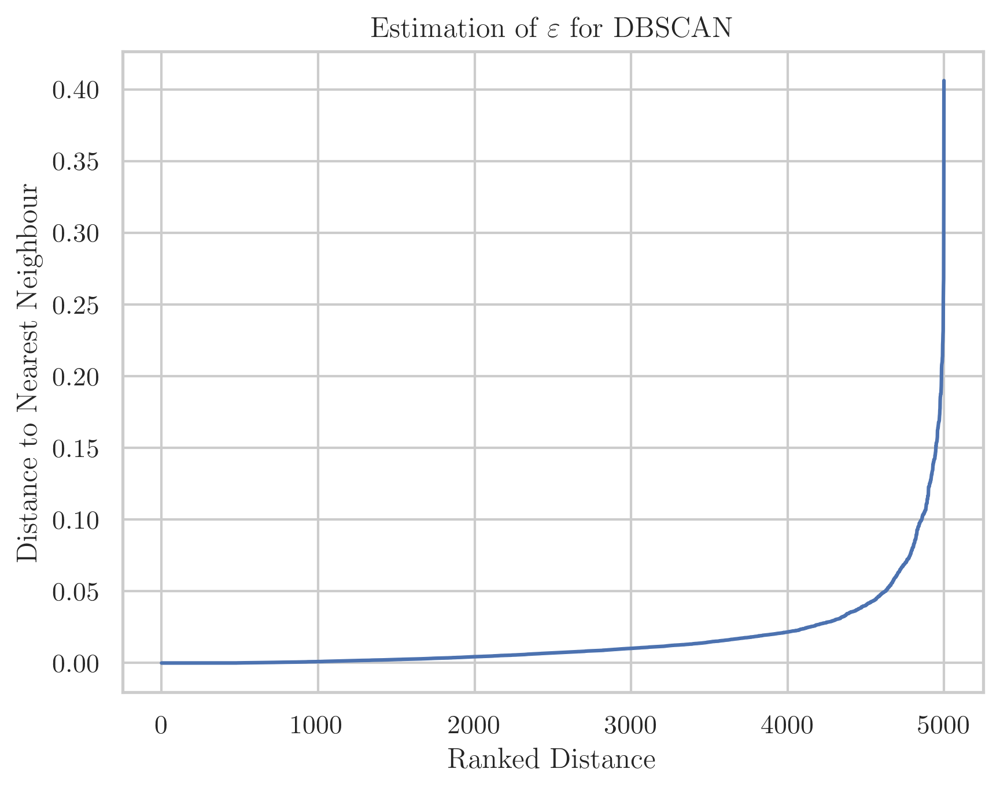

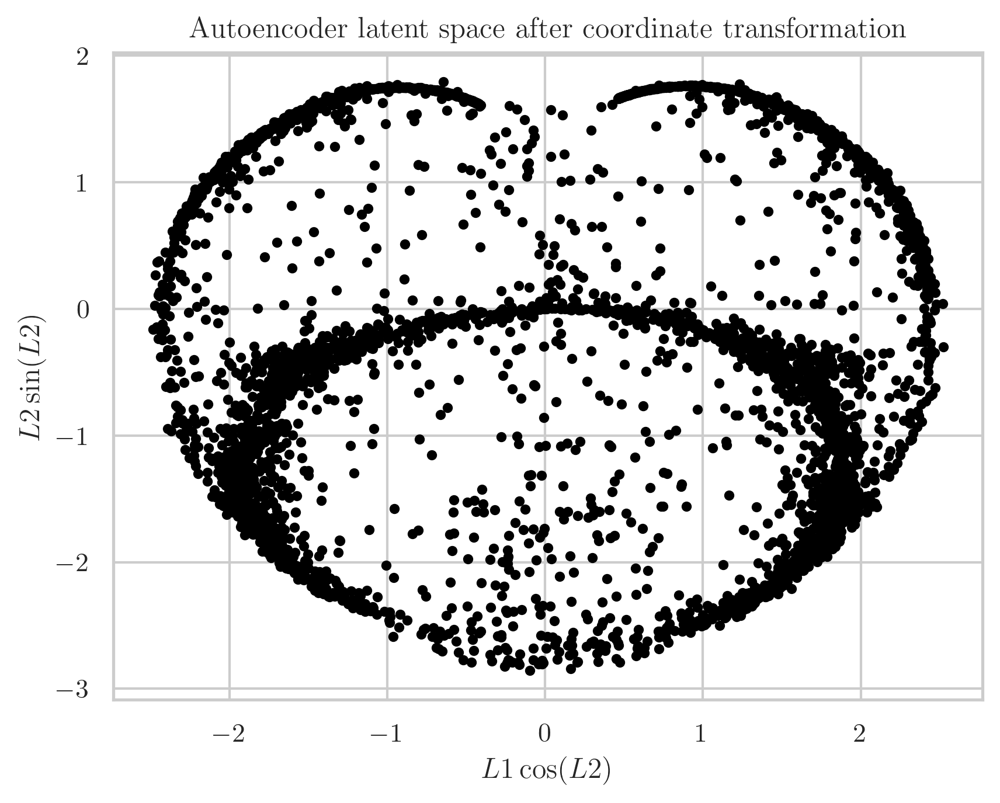

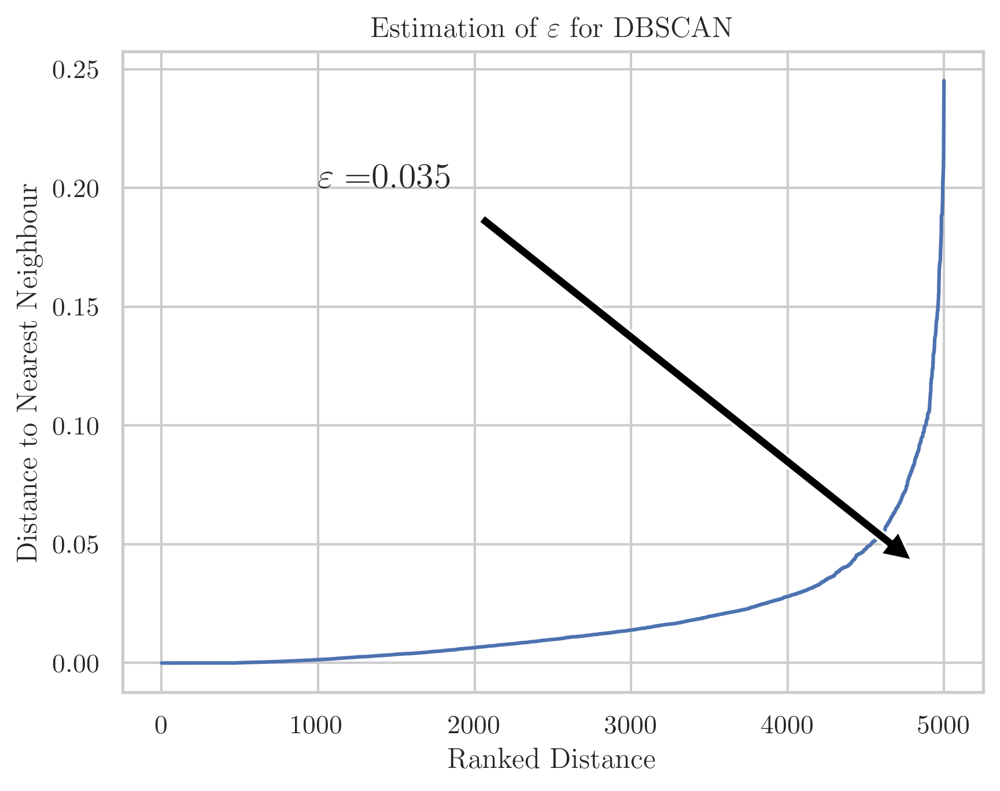

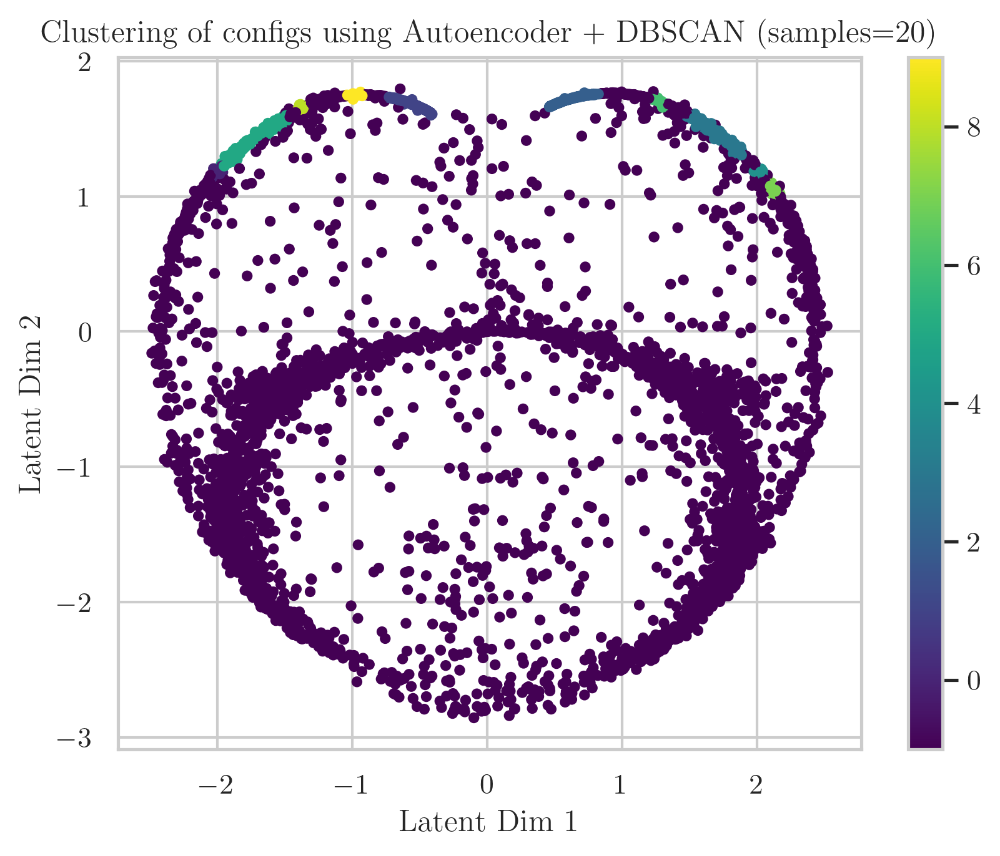

/tmp/ipykernel_365177/3090150631.py:91: RuntimeWarning: divide by zero encountered in divide
  plt.plot(-x*np.asinh(1/np.sinh(2/x))-1, x, '--', color='red')
/tmp/ipykernel_365177/3090150631.py:92: RuntimeWarning: divide by zero encountered in divide
  plt.plot(x*np.asinh(1/np.sinh(2/x)) - 1, x, '--', color='red' )


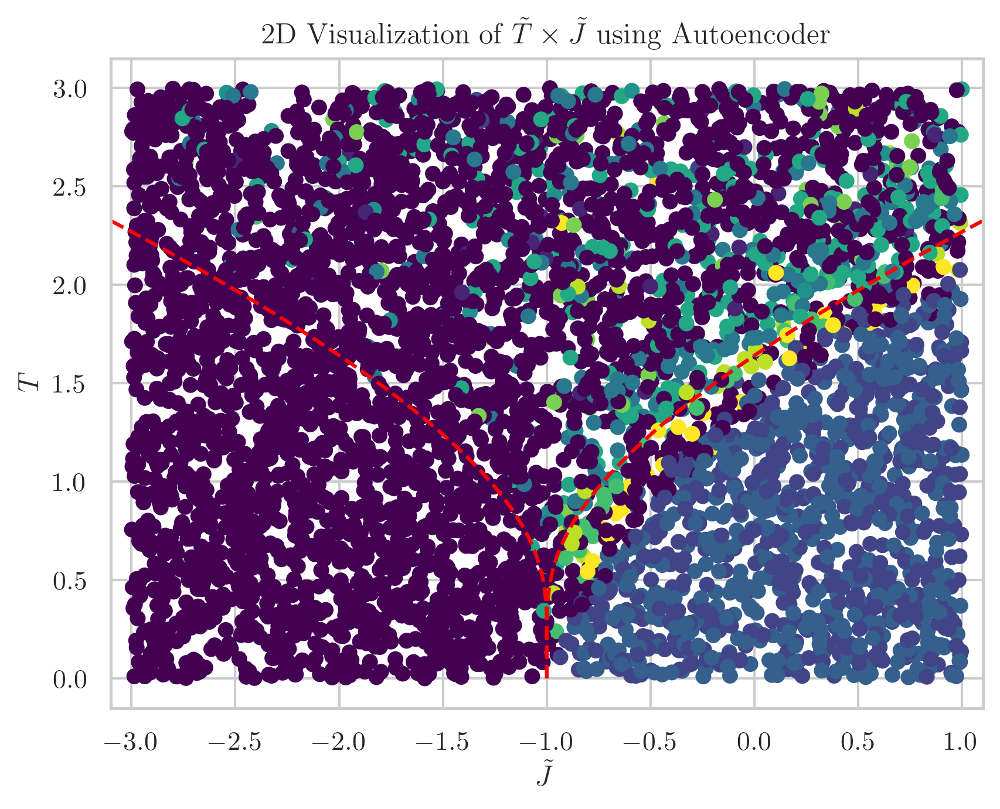

In [76]:
batchSize = 5000
testset = ds.CustomAutoencoderDataset(data_dir+"test", side, transform)
data_loader = torch.utils.data.DataLoader(testset, batch_size=batchSize, shuffle=False)
images = []
model.eval()
with torch.no_grad():
    # Get a batch of data
    images, params = next(iter(data_loader))
    # images = images.numpy()
    images = images.to(device)
    # Pass images through encoder to get latent vectors
    latent_vectors = model.encoder(images.view(images.size(0), -1)).cpu().numpy()
    images = images.cpu().numpy()
    params = params.cpu().numpy()

L1 = latent_vectors[:, 0]; L2 = latent_vectors[:, 1]
plt.title("Autoencoder latent space representation of configs")
plt.xlabel('Latent Dim 1')
plt.ylabel('Latent Dim 2')
plt.scatter(L1, L2, s=10, c='black')
plt.show()
print("PCA components:", latent_vectors.shape)

neighbours = NearestNeighbors(n_neighbors=10)
neighbours_fit2 = neighbours.fit(latent_vectors)
distances2,_ = neighbours_fit2.kneighbors(latent_vectors)


distances2 = np.sort(distances2, axis=0)
distances2 = distances2[:, 1]  # Exclude the first column (distance to itself)
print("Nearest Neighbours distances:", distances2.shape)

plt.plot(distances2, label='Nearest Neighbours Distance')
plt.title(r'Estimation of $\varepsilon$ for DBSCAN')
plt.xlabel('Ranked Distance')
plt.ylabel('Distance to Nearest Neighbour')
# plt.annotate(r'$\varepsilon=1$', xy=(1350, 1), xytext=(1100, 1.5),
#              arrowprops=dict(facecolor='black', shrink=0.05),
#              fontsize=15)
plt.show()


# coordinate transformation
L1 = latent_vectors[:, 0]*np.cos(latent_vectors[:, 1]); L2 = latent_vectors[:, 0]*np.sin(latent_vectors[:, 1])
pca_Trans = np.column_stack((L1, L2))


plt.title("Autoencoder latent space after coordinate transformation")
plt.xlabel(r'$L1\cos(L2)$')
plt.ylabel(r'$L2\sin(L2)$')
plt.scatter(L1, L2, s=10, c='black', label='PCA (NN)')
plt.show()

neighbours = NearestNeighbors(n_neighbors=10)
neighbours_fit2 = neighbours.fit(pca_Trans)
distances2,_ = neighbours_fit2.kneighbors(pca_Trans)

distances2 = np.sort(distances2, axis=0)
distances2 = distances2[:, 1]  # Exclude the first column (distance to itself)


epsilon = 0.035
min_samples = 20
dbscan2 = DBSCAN(eps=epsilon, min_samples=min_samples)
labels2 = dbscan2.fit_predict(np.column_stack((L1, L2)))


plt.plot(distances2, label='Nearest Neighbours Distance')
plt.title(r'Estimation of $\varepsilon$ for DBSCAN')
plt.xlabel('Ranked Distance')
plt.ylabel('Distance to Nearest Neighbour')
plt.annotate(r'$\varepsilon=$'+str(epsilon), xy=(batchSize-50, epsilon), xytext=(1000, 0.2),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=15)
plt.show()


scatter2 = plt.scatter(L1, L2, c=labels2, cmap='viridis', s=10)
plt.colorbar(scatter2)
plt.title("Clustering of configs using Autoencoder + DBSCAN (samples="+str(min_samples)+")")
plt.xlabel('Latent Dim 1')
plt.ylabel('Latent Dim 2')
# plt.legend()
plt.show()


plt.scatter(params[:, 0], params[:,1], c=labels2, cmap='viridis', s=30)
# plt.colorbar(scatter, ticks=range(10), label='PCA of Latent Space')
plt.title(r'2D Visualization of $\tilde{T} \times \tilde{J}$ using Autoencoder')
x = np.linspace(0, 3, 400)
plt.plot(-x*np.asinh(1/np.sinh(2/x))-1, x, '--', color='red')
plt.plot(x*np.asinh(1/np.sinh(2/x)) - 1, x, '--', color='red' )
plt.xlim(-3.1,1.1)
plt.xlabel(r'$\tilde{J}$')
plt.ylabel(r'$T$')
plt.show()

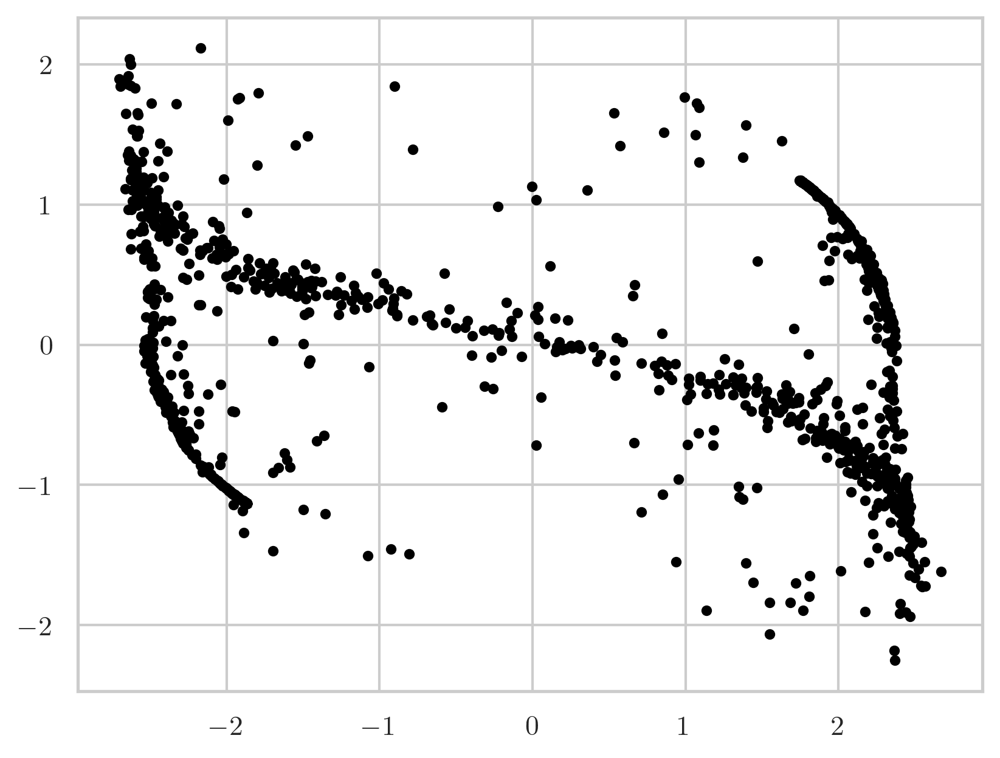

PCA components: (1400, 2)
Nearest Neighbours distances: (1400,)


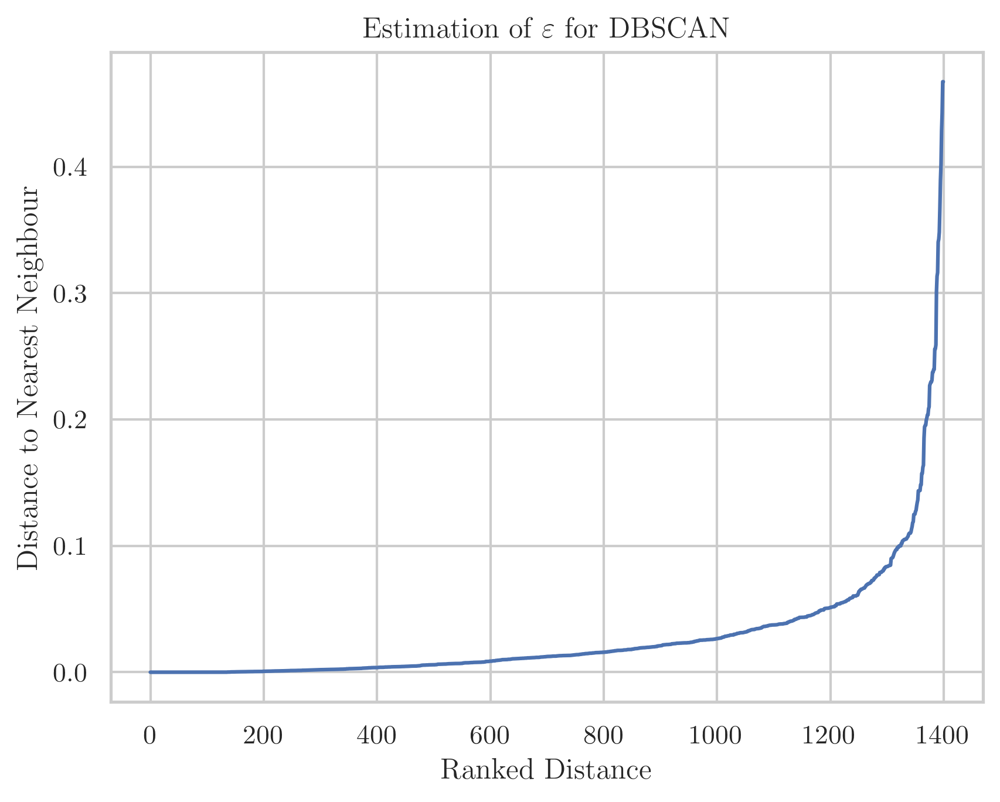

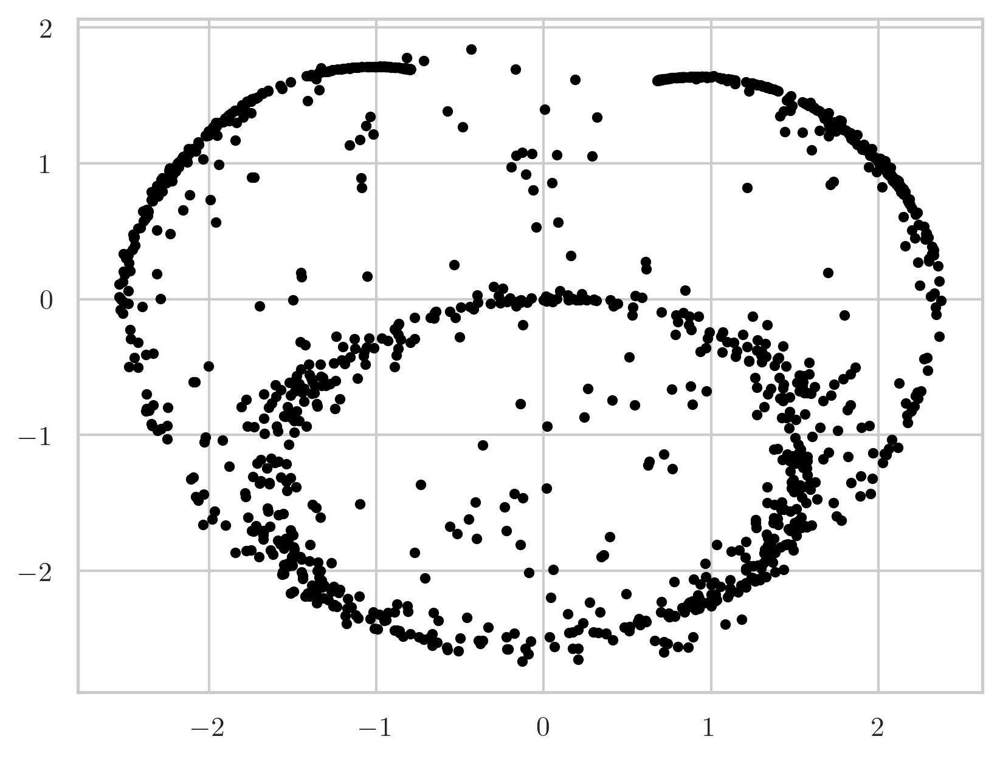

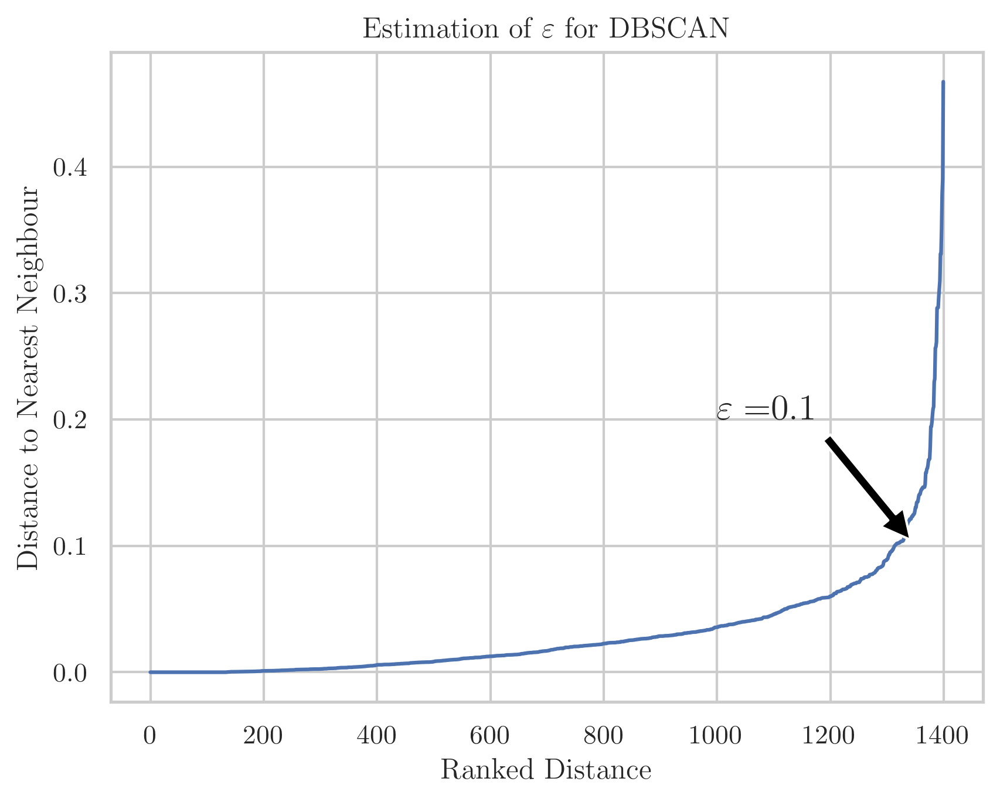

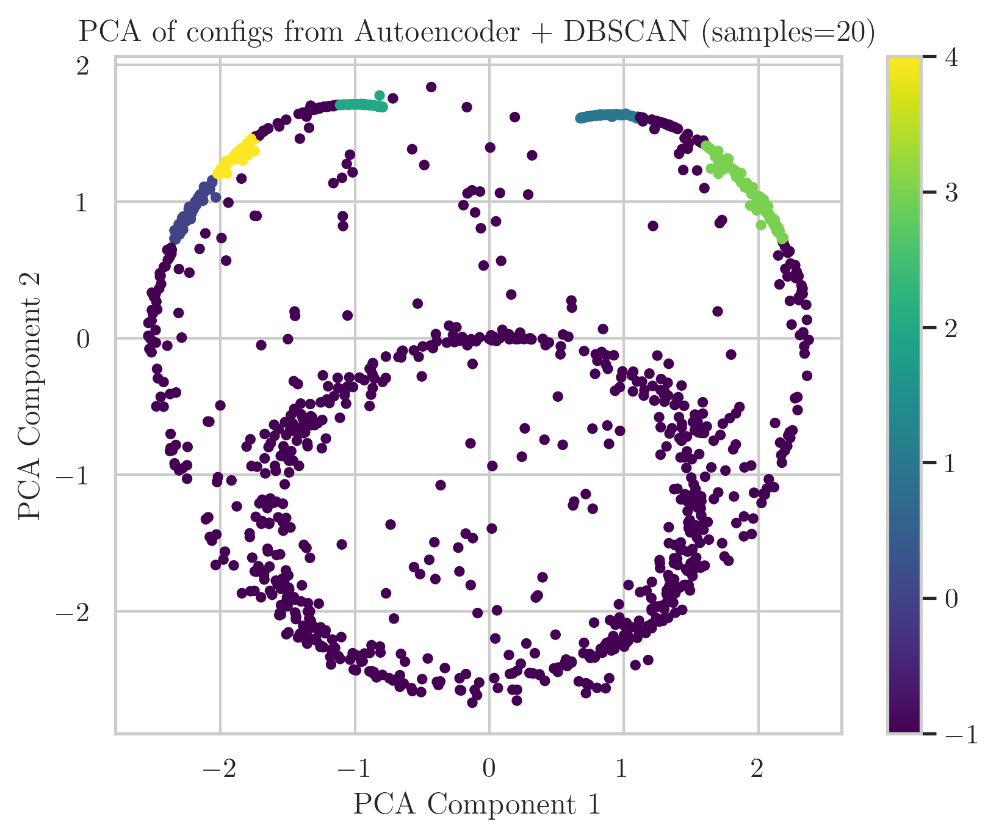

/tmp/ipykernel_365177/604322499.py:70: RuntimeWarning: divide by zero encountered in divide
  plt.plot(-x*np.asinh(1/np.sinh(2/x))-1, x, '--', color='red')
/tmp/ipykernel_365177/604322499.py:71: RuntimeWarning: divide by zero encountered in divide
  plt.plot(x*np.asinh(1/np.sinh(2/x)) - 1, x, '--', color='red' )


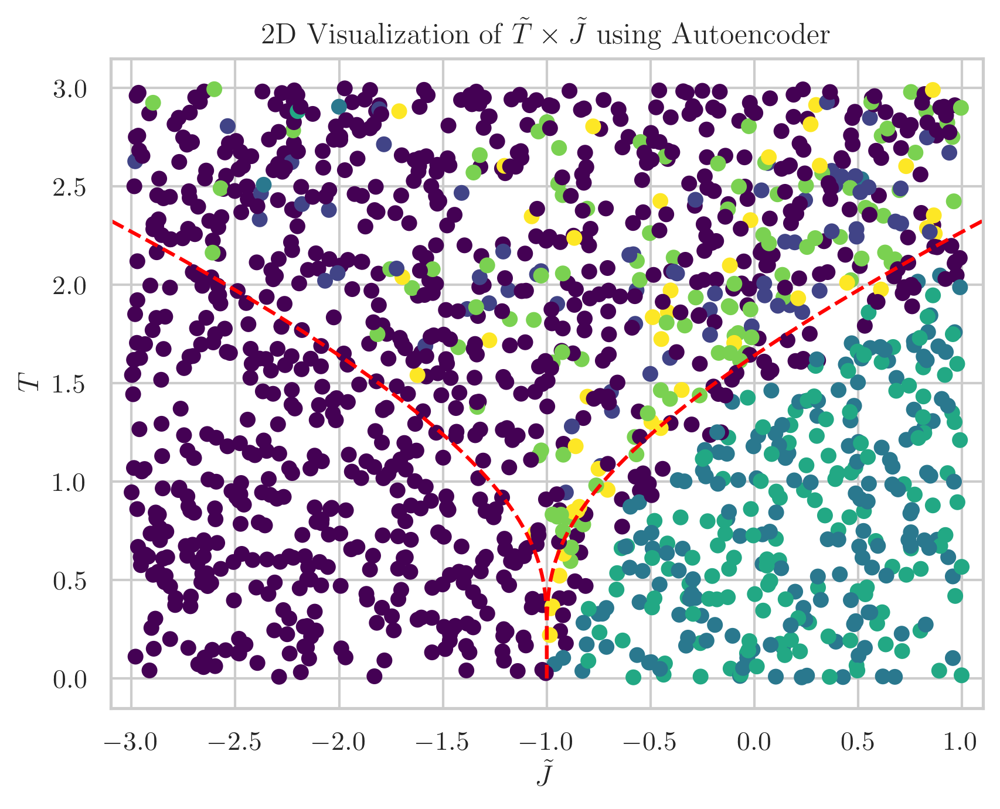

In [84]:
# plt.plot(tSNE_2d[:, 0], tSNE_2d[:, 1], 'o', markersize=1, alpha=0.5, label='t-SNE')

L1 = pca_NN[:, 0]; L2 = pca_NN[:, 1]
plt.scatter(L1, L2, s=10, c='black', label='PCA (NN)')
plt.show()
print("PCA components:", pca_NN.shape)

# neighbours = NearestNeighbors(n_neighbors=10)
neighbours_fit2 = neighbours.fit(pca_NN)
distances2,_ = neighbours_fit2.kneighbors(pca_NN)

distances2 = np.sort(distances2, axis=0)
distances2 = distances2[:, 1]  # Exclude the first column (distance to itself)
print("Nearest Neighbours distances:", distances2.shape)

epsilon = 0.1
plt.plot(distances2, label='Nearest Neighbours Distance')
plt.title(r'Estimation of $\varepsilon$ for DBSCAN')
plt.xlabel('Ranked Distance')
plt.ylabel('Distance to Nearest Neighbour')
# plt.annotate(r'$\varepsilon=1$', xy=(1350, 1), xytext=(1100, 1.5),
#              arrowprops=dict(facecolor='black', shrink=0.05),
#              fontsize=15)
plt.show()


# coordinate transformation
L1 = pca_NN[:, 0]*np.cos(pca_NN[:, 1]); L2 = pca_NN[:, 0]*np.sin(pca_NN[:, 1])
pca_Trans = np.column_stack((L1, L2))

plt.scatter(L1, L2, s=10, c='black', label='PCA (NN)')
plt.show()

neighbours = NearestNeighbors(n_neighbors=10)
neighbours_fit2 = neighbours.fit(pca_Trans)
distances2,_ = neighbours_fit2.kneighbors(pca_Trans)

distances2 = np.sort(distances2, axis=0)
distances2 = distances2[:, 1]  # Exclude the first column (distance to itself)

plt.plot(distances2, label='Nearest Neighbours Distance')
plt.title(r'Estimation of $\varepsilon$ for DBSCAN')
plt.xlabel('Ranked Distance')
plt.ylabel('Distance to Nearest Neighbour')
plt.annotate(r'$\varepsilon=$'+str(epsilon), xy=(1350, epsilon), xytext=(1000, 0.2),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=15)
# plt.ylim(0.05, 0.3)
# plt.xlim(1000, 1400)
plt.show()


min_samples = 20
dbscan2 = DBSCAN(eps=epsilon, min_samples=min_samples)
labels2 = dbscan2.fit_predict(pca_Trans)

scatter2 = plt.scatter(L1, L2, c=labels2, cmap='viridis', s=10)
plt.colorbar(scatter2)
plt.title("PCA of configs from Autoencoder + DBSCAN (samples="+str(min_samples)+")")
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
# plt.legend()
plt.show()


plt.scatter(params[:, 0], params[:,1], c=labels2, cmap='viridis', s=30)
# plt.colorbar(scatter, ticks=range(10), label='PCA of Latent Space')
plt.title(r'2D Visualization of $\tilde{T} \times \tilde{J}$ using Autoencoder')
x = np.linspace(0, 3, 400)
plt.plot(-x*np.asinh(1/np.sinh(2/x))-1, x, '--', color='red')
plt.plot(x*np.asinh(1/np.sinh(2/x)) - 1, x, '--', color='red' )
plt.xlim(-3.1,1.1)
plt.xlabel(r'$\tilde{J}$')
plt.ylabel(r'$T$')
plt.show()

In [12]:
vals = []
for i in labels2:
    if i in vals:
        continue
    vals.append(i)
print("Number of clusters found: ", len(vals))
print(vals)


vals = []
for i in labels:
    if i in vals:
        continue
    vals.append(i)
print("Number of clusters found: ", len(vals))
print(vals)


    

Number of clusters found:  5
[np.int64(-1), np.int64(0), np.int64(1), np.int64(2), np.int64(3)]
Number of clusters found:  6
[np.int64(0), np.int64(-1), np.int64(1), np.int64(2), np.int64(3), np.int64(4)]


/tmp/ipykernel_365177/400568203.py:18: RuntimeWarning: divide by zero encountered in divide
  plt.plot(-x*np.asinh(1/np.sinh(2/x))-1, x, '--', color='red')
/tmp/ipykernel_365177/400568203.py:19: RuntimeWarning: divide by zero encountered in divide
  plt.plot(x*np.asinh(1/np.sinh(2/x)) - 1, x, '--', color='red' )


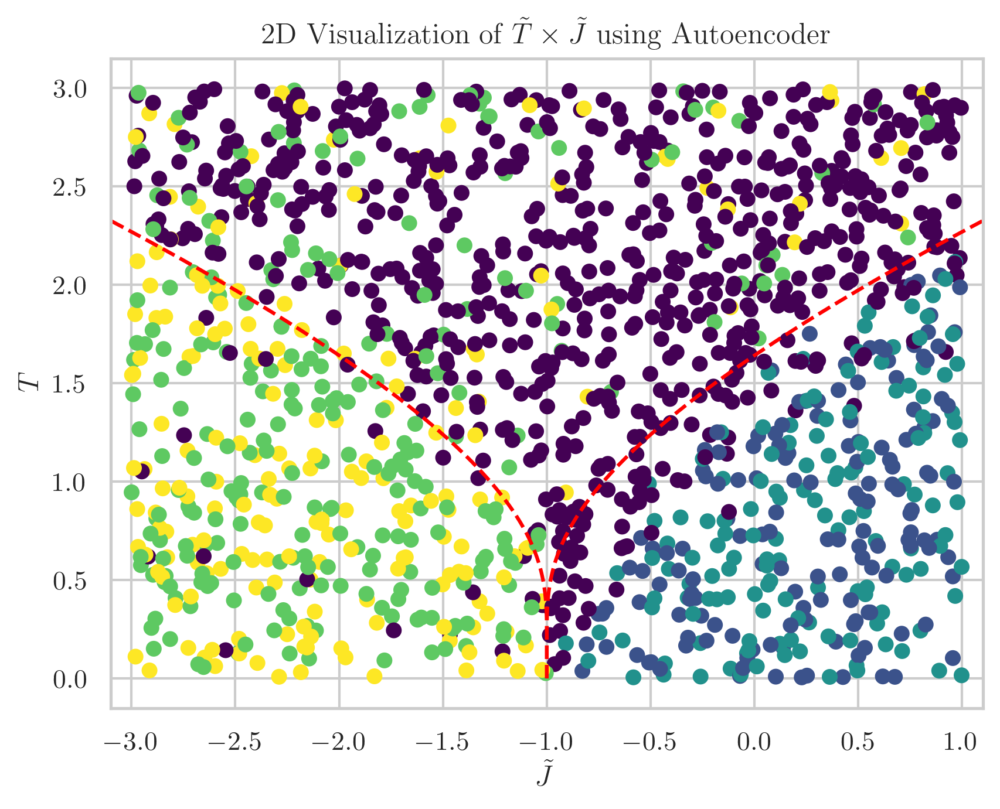

In [15]:
# #trainset with 5000 samples
# plt.scatter(params[:, 0], params[:,1], c=labels, cmap='viridis', s=30)
# # plt.colorbar(scatter, ticks=range(10), label='PCA of Latent Space')
# plt.title(r'2D Visualization of $\tilde{T} \times \tilde{J}$ using PCA')
# x = np.linspace(0, 3, 400)
# plt.plot(-x*np.asinh(1/np.sinh(2/x))-1, x, '--', color='red')
# plt.plot(x*np.asinh(1/np.sinh(2/x)) - 1, x, '--', color='red' )
# plt.xlim(-3.1,1.1)
# plt.xlabel(r'$\tilde{J}$')
# plt.ylabel(r'$T$')
# plt.show()


plt.scatter(params[:, 0], params[:,1], c=labels2, cmap='viridis', s=30)
# plt.colorbar(scatter, ticks=range(10), label='PCA of Latent Space')
plt.title(r'2D Visualization of $\tilde{T} \times \tilde{J}$ using Autoencoder')
x = np.linspace(0, 3, 400)
plt.plot(-x*np.asinh(1/np.sinh(2/x))-1, x, '--', color='red')
plt.plot(x*np.asinh(1/np.sinh(2/x)) - 1, x, '--', color='red' )
plt.xlim(-3.1,1.1)
plt.xlabel(r'$\tilde{J}$')
plt.ylabel(r'$T$')
plt.show()

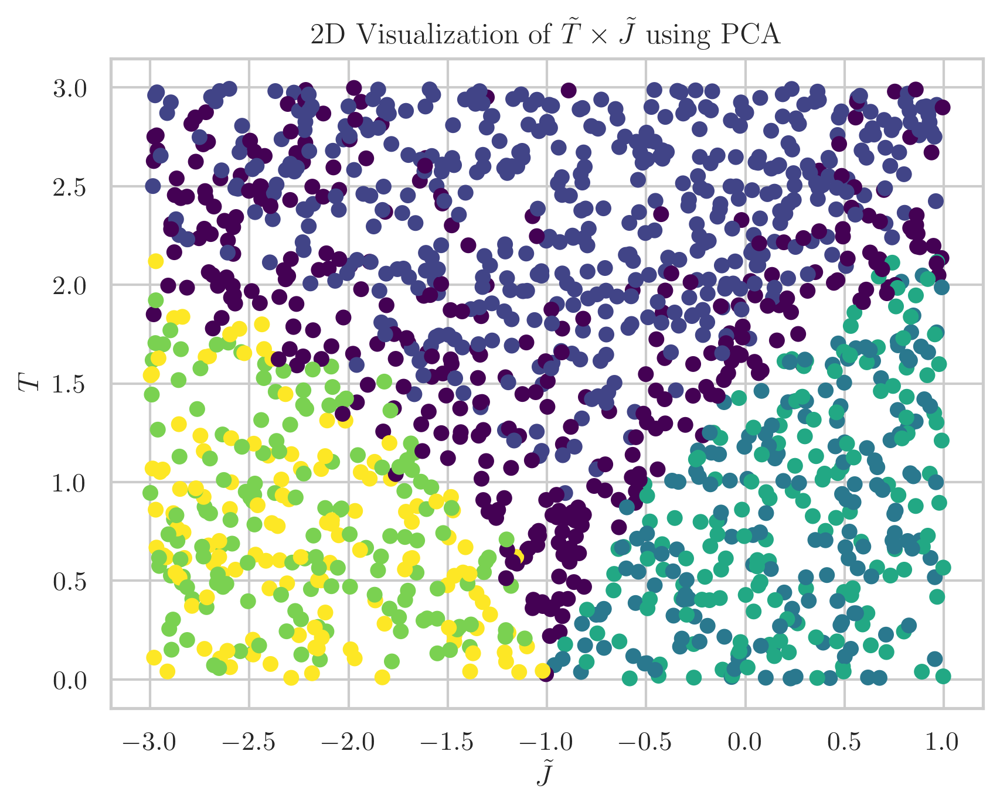

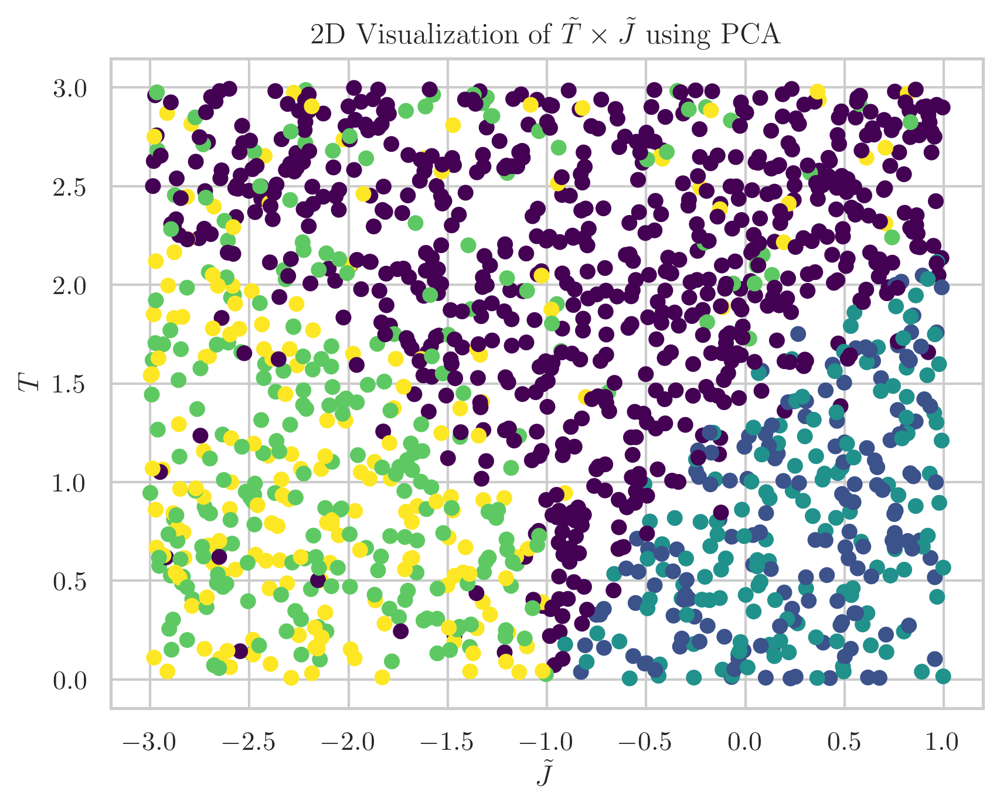

In [16]:
# trainset with 1400 samples
plt.scatter(params[:, 0], params[:,1], c=labels, cmap='viridis', s=30)
# plt.colorbar(scatter, ticks=range(10), label='PCA of Latent Space')
plt.title(r'2D Visualization of $\tilde{T} \times \tilde{J}$ using PCA')
plt.xlabel(r'$\tilde{J}$')
plt.ylabel(r'$T$')
plt.show()


plt.scatter(params[:, 0], params[:,1], c=labels2, cmap='viridis', s=30)
# plt.colorbar(scatter, ticks=range(10), label='PCA of Latent Space')
plt.title(r'2D Visualization of $\tilde{T} \times \tilde{J}$ using PCA')
plt.xlabel(r'$\tilde{J}$')
plt.ylabel(r'$T$')
plt.show()

In [37]:
# model.load_state_dict(torch.load(data_dir+f"checkpoints/Autoencoder/2025-06-12_18/2/model_epoch_990.pth", map_location=device))
# visualize_reconstruction(model, testLoader)
# visualize_reconstruction(model,  smallTrainLoader)


# model.load_state_dict(torch.load(data_dir+f"checkpoints/Autoencoder/2025-06-12_18/1/model_epoch_50.pth", map_location=device))
visualize_reconstruction(model, data_loader)
# visualize_reconstruction(model,  smallTrainLoader)

RuntimeError: mat1 and mat2 shapes cannot be multiplied (150000x30 and 900x750)

In [36]:

def visualize_reconstruction(model, data_loader):
    model.eval()
    with torch.no_grad():
        images, _ = next(iter(data_loader))
        images = images.to(device)
        reconstructed = model(images)

        # Plot original vs reconstructed images
        fig, axes = plt.subplots(2, 8, figsize=(15, 4))
        for i in range(8):
            # Original images
            axes[0,i].imshow(images[i].cpu().numpy().squeeze().reshape(30, 30), cmap='gray')
            axes[0,i].axis('off')

            # Reconstructed images
            axes[1,i].imshow(reconstructed[i].cpu().numpy().squeeze().reshape(30, 30), cmap='gray')
            axes[1,i].axis('off')

        plt.tight_layout()
        plt.show()